# Pectoral Muscle Removal from Mammograms

In [1]:
# from numpy import asarray
# directory = './all-mias'
# count=0
# l1=[]
# l2=[]
# import os
# count1=0
# count2=0
# filename1='./Normal/'
# filename2='./Abnormal/'
# image=[]
# for filename in os.listdir(directory):
#     filename = directory+'/'+ filename
#     if filename.endswith('.pgm'):
#         image=cv2.imread(filename)
#         image= cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
#         if label[count]==0:
#             continue
#         if label[count]==1:
#             count1=count1+1
#             filename11=filename1+str(count1)+".pgm"
#             cv2.imwrite(filename11, image) 
#         else:
#             count2=count2+1
#             filename22=filename2+str(count2)+".pgm"
#             cv2.imwrite(filename22, image) 
#         count=count+1

In [2]:
# from csv import reader
# dict={'B':0,'M':1}

# label=[]
# with open('Info.csv', 'r') as read_obj:
#     # pass the file object to reader() to get the reader object
#     csv_reader = reader(read_obj)
#     # Iterate over each row in the csv using reader object
#     for row in csv_reader:
#         # row variable is a list that represents a row in csv
#        # print(row)
#         if(row[0].split(" ")[2]=="NORM"):
#             label.append(0)
#         else:
#             label.append(dict[row[0].split(" ")[3]])
            
# full_data_y=np.array(label[:322])
# plt.imshow(full_data_x[321])

In [3]:
# # Importing necessary functions 
# from keras.preprocessing.image import ImageDataGenerator,  array_to_img, img_to_array, load_img 
# from numpy import asarray
# directory = './Normal'
# i1=0
# # Initialising the ImageDataGenerator class. 
# # We will pass in the augmentation parameters in the constructor. 
# datagen = ImageDataGenerator( 
#         rotation_range = 40, 
#         shear_range = 0.2, 
#         zoom_range = 0.2, 
#         horizontal_flip = True, 
#         brightness_range = (0.5, 1.5)) 
# for filename in os.listdir(directory):
#     filename = directory+'/'+ filename
#     if i1==268:
#         break
#     i1=i1+1
#     print(i1)
#     # Loading a sample image  
#     img = load_img(filename)  
#     # Converting the input sample image to an array 
#     x = img_to_array(img) 
#     # Reshaping the input image 
#     x = x.reshape((1, ) + x.shape)  

#     # Generating and saving 5 augmented samples  
#     # using the above defined parameters.  
#     i = 0
#     for batch in datagen.flow(x, batch_size = 1, 
#                               save_to_dir ='Normal',  
#                               save_prefix ='image', save_format ='pgm'): 
#         i += 1
#         if i > 5: 
#             break

In [4]:
# # Importing necessary functions 
# from keras.preprocessing.image import ImageDataGenerator,  array_to_img, img_to_array, load_img 
# from numpy import asarray
# directory = './Abnormal'
# i1=0
# # Initialising the ImageDataGenerator class. 
# # We will pass in the augmentation parameters in the constructor. 
# datagen = ImageDataGenerator( 
#         rotation_range = 40, 
#         shear_range = 0.2, 
#         zoom_range = 0.2, 
#         horizontal_flip = True, 
#         brightness_range = (0.5, 1.5)) 
# for filename in os.listdir(directory):
#     filename = directory+'/'+ filename
#     if i1==54:
#         break
#     i1=i1+1
#     print(i1)
#     # Loading a sample image  
#     img = load_img(filename)  
#     # Converting the input sample image to an array 
#     x = img_to_array(img) 
#     # Reshaping the input image 
#     x = x.reshape((1, ) + x.shape)  

#     # Generating and saving 5 augmented samples  
#     # using the above defined parameters.  
#     i = 0
#     for batch in datagen.flow(x, batch_size = 1, 
#                               save_to_dir ='Abnormal',  
#                               save_prefix ='image', save_format ='pgm'): 
#         i += 1
#         if i > 5: 
#             break

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pylab as pylab
import os
from PIL import Image
import os
import csv 
from csv import reader
import cv2
from PIL import Image
from PIL import Image, ImageChops  
import os
from PIL import Image  
import os
import csv 
from csv import reader
import cv2
from PIL import Image
from scipy import ndimage, misc
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import skimage
from skimage.filters import threshold_otsu, threshold_local
import scipy.misc
import cv2 as cv
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from scipy.sparse import csr_matrix
from scipy import stats
from my_ml_lib import DataManipulationTools, MetricTools, PlotTools
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [19]:
from skimage import io
from skimage import color
import cv2

def right_orient_mammogram(image):
    left_nonzero = cv2.countNonZero(image[:, 0:int(image.shape[1]/2)])
    right_nonzero = cv2.countNonZero(image[:, int(image.shape[1]/2):])
    
    if(left_nonzero < right_nonzero):
        image = cv2.flip(image, 1)

    return image

def read_image(filename):
    image = io.imread(filename)
    image = color.rgb2gray(image)
    image = right_orient_mammogram(image)
    return image



### Applying canny edge detection

In [20]:
from skimage.feature import canny
from skimage.filters import sobel

def apply_canny(image):
    canny_img=cv2.Sobel(image,cv2.CV_64F,0,1,ksize=9)
    return sobel(canny_img)

### Applying Hough transform
Once we have obtained the edges using the Canny Edge Detector, we can apply Hough transform and make a list of output lines.

Each line is represented by an object with the following attributes
 - `dist`: perpendicular distance of the line from origin
 - `angle`: angle (in degrees) made by the perpendicular from the positive x-axis. This perpendicular is dropped on the line from the origin
 - `point1`, `point2`: two points on the line
 
Note: The x-axis and y-axis are oriented as shown in the image ouputs below.

In [21]:
from skimage.transform import hough_line, hough_line_peaks

def get_hough_lines(canny_img):
    h, theta, d = hough_line(canny_img)   
    lines = list()
    #print('\nAll hough lines')
    for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
        #print("Angle: {:.2f}, Dist: {:.2f}".format(np.degrees(angle), dist))
        x1 = 0
        y1 = (dist - x1 * np.cos(angle)) / np.sin(angle)
        x2 = canny_img.shape[1]
        y2 = (dist - x2 * np.cos(angle)) / np.sin(angle)
        lines.append({
            'dist': dist,
            'angle': np.degrees(angle),
            'point1': [x1, y1],
            'point2': [x2, y2]
        })
    
    return lines

### Shortlisting lines
We need to shortlist possible candidates for pectoral segmentation. A simple criteria for shortlisting can be simply checking whether the `angle` and `dist` values of each line lies inside a particular interval.

The intervals are `MIN_ANGLE <= angle <= MAX_ANGLE` and `MIN_DIST <= dist <= MAX_DIST`.

These 4 parameters can be easily learned given a bigger dataset of mammograms. However, for now these have been picked manually using judgement on the given 5 images, and seem to work well.

In [22]:
def shortlist_lines(lines):
    #print(len(lines)," len of lines")
    MIN_ANGLE = 10
    MAX_ANGLE = 70
    MIN_DIST  = 5
    MAX_DIST  = 1023
    
    shortlisted_lines = [x for x in lines if 
                          (x['dist']>=MIN_DIST) &
                          (x['dist']<=MAX_DIST) &
                          (x['angle']>=MIN_ANGLE) &
                          (x['angle']<=MAX_ANGLE)
                        ]
#     print('\nShorlisted lines')
#     for i in shortlisted_lines:
#         print("Angle: {:.2f}, Dist: {:.2f}".format(i['angle'], i['dist']))
        
    return shortlisted_lines

### Removing pectoral region
If more than one line is shortlisted, we select the one which will cause the least loss of information (the safest approach).

For this, we sort these lines by their distance from origin `dist` and pick the nearest line. Then we simply set the value to zero of those pixels enclosed within a polygon formed by the picked line and the border of the image.

In [23]:
from skimage.draw import polygon

def remove_pectoral(shortlisted_lines):
    shortlisted_lines.sort(key = lambda x: x['dist'])
    if len(shortlisted_lines) == 0:
        return ([0,0,0],[0,0,0])
    pectoral_line = shortlisted_lines[0]
    d = pectoral_line['dist']
    theta = np.radians(pectoral_line['angle'])
    
    x_intercept = d/np.cos(theta)
    y_intercept = d/np.sin(theta)
    if x_intercept>=1024:
        x_intercept=1023
    if y_intercept>=1024:
        y_intercept=1023
    
    return polygon([0, 0, y_intercept], [0, x_intercept, 0])

### Displaying final result
The result for all the five images is displayed below. We can easily compare the removed pectoral area with the original image.

In [24]:
import os
import cv2
import copy
import csv
import random
import pickle
import numpy as np
import pandas as pd
import itertools
from scipy.stats import randint
from itertools import cycle
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from scipy.sparse import csr_matrix
from scipy import stats
# Import different classifiers
from sklearn import svm
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA
from skimage.feature import hog, local_binary_pattern, greycomatrix, greycoprops
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
def get_glcm(images, name='glcm', save=True):
    
    # GLCM feature for 1 image
    def get_image_glcm(img):
        image = img
        
        # GLCM Feature Extraction
        Grauwertmatrix = greycomatrix(image, [1, 2, 3], [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4],
                                                  symmetric=False, normed=True)
        
        contrast = greycoprops(Grauwertmatrix, 'contrast')
        #dissimilarity = greycoprops(Grauwertmatrix, 'dissimilarity')
        homogeneity = greycoprops(Grauwertmatrix, 'homogeneity')
        energy = greycoprops(Grauwertmatrix, 'energy')
        correlation = greycoprops(Grauwertmatrix, 'correlation')
        #ASM = greycoprops(Grauwertmatrix, 'ASM')
        
        # Merge all the features
        f = np.array([contrast, homogeneity, energy, correlation])
        return f.flatten()
    
    
    # GLCM descriptor for all images
    features = []
    for img in images:
        dsc = get_image_glcm(img)
        features.append(dsc)
    
    result = np.array(features)
    
    if save:
        save_feature(result, name)
        
    return result

In [25]:
def combine_features(features, horizontal=True):
    """
    Array of features [f1, f2, f3] where each fi is a feature set 
    eg. f1=rgb_flat, f2=SIFT, etc.
    """
    if horizontal:
        return np.hstack(features)
    else:
        return np.vstack(features)

In [26]:
def save_feature(feature, name):
    # saving all our feature vectors in pickled file
    with open( name + '.pkl', 'wb') as fp:
        pickle.dump(csr_matrix(feature), fp)
    
    print(f'Feature saved with name cache/{name}.pkl')

def load_feature(feature_name):
    return pickle.load(open(feature_name, 'rb')).A

In [27]:
def confusion_mat(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues, figsize=(7,7), path=None, filename=None):
        """
        cm: confusion matrix to be plotted.
        classes: array of labels or class names.
        title: title of the confusion matrix.
        cmap: color of the plot matrix.
        figsize: tupple (width, height) representiong size of the plot.
        path: destination where the plot image will be saved.
        filename: name to save the file with on the specified path. (if None, title is used)
        
        # Source: https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
        """
        cm = cm.astype(np.int64)
        plt.figure(figsize=figsize)
        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = 'd'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        plt.grid(False)
        plt.ylabel('True label')
        plt.xlabel('Predicted label')
        plt.tight_layout()
        
        if path:
            if filename is None:
                plt.savefig(path + title + '.png')
            else:
                plt.savefig(path + filename + '.png')
        plt.show()

In [28]:
list2=[]
def display_image(filename):
    
    image = cv2.imread(filename)
    image= cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) 
    
#     image=right_orient_mammogram(image)
    
#     plt.imshow(image,'gray')
#     plt.show()

    global_thresh = threshold_otsu(image)
    ret, thresh = cv2.threshold(image, global_thresh, 255, 0)
#         #get contours
    __,contours, hierarchy = cv2.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE) 
#         #draw contour 
#     s=cv.drawContours(thresh, contours, -1, (0,255,0), 3)
#         #make mask
    mask = np.zeros(image.shape, np.uint8)
    largest_areas = sorted(contours, key=cv2.contourArea)
    cv2.drawContours(mask, [largest_areas[-1]], 0, (255,255,255,255), -1)
    plt.imshow(mask)
    plt.show()
    removed = cv2.bitwise_and(image,mask)
    image=removed
    median = cv2.medianBlur(removed,5)
    clahe = cv2.createCLAHE(clipLimit = 5) 
    final_img = clahe.apply(median) + 30
    image=final_img
    _, ordinary_img = cv2.threshold(image, 155, 255, cv2.THRESH_BINARY) 
    kernel = np.ones((5,5),np.uint8)
    opening = cv2.morphologyEx(median, cv2.MORPH_OPEN, kernel)
    th3 = cv2.adaptiveThreshold(opening,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)
# #     plt.imshow(th3,'gray')
# #     plt.show()
# #     image=final_img
#     canny_image = apply_canny(image)
#     lines = get_hough_lines(canny_image)
#     shortlisted_lines = shortlist_lines(lines)
# #     fig, axes = plt.subplots(1, 5, figsize=(15,10))
# #     fig.tight_layout(pad=3.0)
# #     plt.xlim(0,image.shape[1])
# #     plt.ylim(image.shape[0])
    
     
# #     axes[0].set_title('Right-oriented mammogram')
# #     axes[0].imshow(image, cmap=pylab.cm.gray)
# #     axes[0].axis('on') 
    
# #     axes[1].set_title('Hough Lines on Canny Edge Image')
# #     axes[1].imshow(canny_image, cmap=pylab.cm.gray)
# #     axes[1].axis('on')
# #     axes[1].set_xlim(0,image.shape[1])
# #     axes[1].set_ylim(image.shape[0])
# #     for line in lines:
# #         axes[1].plot((line['point1'][0],line['point2'][0]), (line['point1'][1],line['point2'][1]), '-r')
        
# #     axes[2].set_title('Shortlisted Lines')
# #     axes[2].imshow(canny_image, cmap=pylab.cm.gray)
# #     axes[2].axis('on')
# #     axes[2].set_xlim(0,image.shape[1])
# #     axes[2].set_ylim(image.shape[0])
# #     for line in shortlisted_lines:
# #         axes[2].plot((line['point1'][0],line['point2'][0]), (line['point1'][1],line['point2'][1]), '-r')
        
#     rr, cc = remove_pectoral(shortlisted_lines)
#     image[rr, cc] = 0

    image=cv2.resize(th3,(100,100))
    print(image.shape)
    plt.imshow(image,'gray')
    plt.show()
    
    value = Image.fromarray(image) 
    
    value=np.array(value)
    list2.append(value)
#     value = np.asarray(value).reshape((value.size[1]*value.size[0]))
#     list1=np.ndarray.tolist(value)
#         #print(list1)
#     list2.append(list1)
#         #print(list2)
#     list1=[]   
    
#     axes[3].set_title('Pectoral muscle removed')
#     axes[3].imshow(image, cmap=pylab.cm.gray)
#     axes[3].axis('on') 
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    

    # Showing all the three images 
#     cv2.imshow("ordinary threshold", ordinary_img) 
#     cv2.imshow("CLAHE image", final_img) 

#     axes[4].set_title('Pectoral muscle removed')
#     axes[4].imshow(normalizedImg, cmap=pylab.cm.gray)
#     axes[4].axis('on') 
#     value = Image.fromarray(normalizedImg) 
#     new_width  = 10
#     new_height = 10
#     value = value.resize((new_width, new_height), Image.ANTIALIAS)
#     value = np.asarray(value).reshape((value.size[1]*value.size[0]))
#     list1=np.ndarray.tolist(value)
#         #print(list1)
#     list2.append(list1)
#         #print(list2)
#     list1=[]   
    
#     value=normalizedImg
#     list1=np.ndarray.tolist(value)
#     #print(list1)
#     list2.append(list1)
#     #print(list2)
#     list1=[]
#     print(list2)


In [39]:
# from numpy import asarray
# directory = './all-mias'
# count=0
# import os
# list1=[]
# label1=[]
# i=0
# for filename in os.listdir(directory):
#     filename = directory+'/'+ filename
#     if filename.endswith('.pgm'):
#         if label[i]!=-1:
#             label1.append(label[i])
#             display_image(filename)
#         i=i+1
# full_data_x = list2

# # get_glcm(list2)
# # with open("img_pixels.csv", 'w',newline='') as csvfile:  
# #     # creating a csv writer object  
# #     csvwriter = csv.writer(csvfile)  
        
# #     # writing the fields  
# #     csvwriter.writerows(list2)
# #     print("done")
        

In [40]:
from csv import reader
dict={'B':0,'M':1}

label=[]
with open('Info.csv', 'r') as read_obj:
    # pass the file object to reader() to get the reader object
    csv_reader = reader(read_obj)
    # Iterate over each row in the csv using reader object
    for row in csv_reader:
        # row variable is a list that represents a row in csv
       # print(row)
        if(row[0].split(" ")[2]=="NORM"):
            label.append(0)
        else:
            label.append(dict[row[0].split(" ")[3]])
            
full_data_y=np.array(label[:322])
# plt.imshow(full_data_x[321])

./all-mias/mdb001.pgm


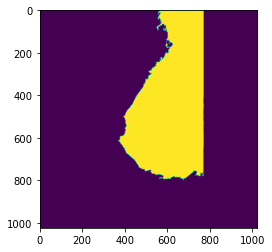

(100, 100)


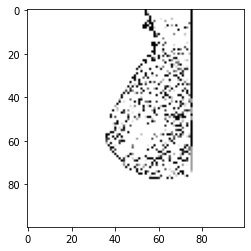

./all-mias/mdb002.pgm


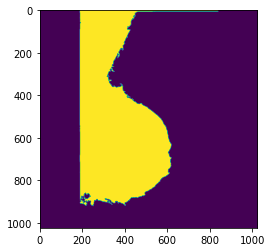

(100, 100)


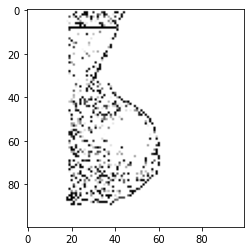

./all-mias/mdb003.pgm


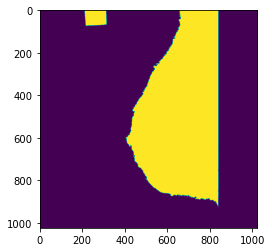

(100, 100)


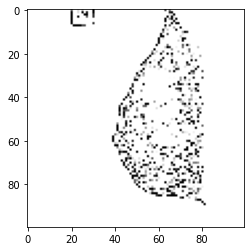

./all-mias/mdb004.pgm


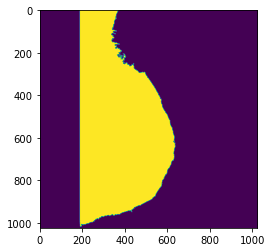

(100, 100)


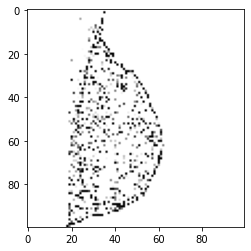

./all-mias/mdb005.pgm


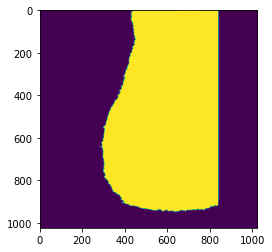

(100, 100)


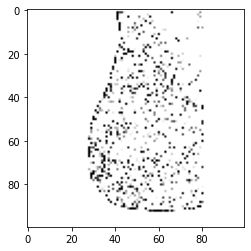

./all-mias/mdb006.pgm


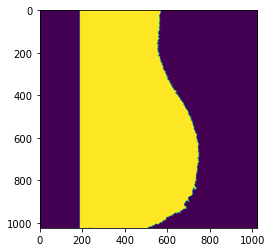

(100, 100)


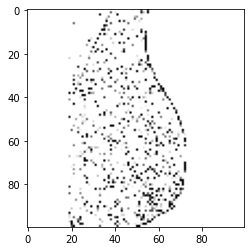

./all-mias/mdb007.pgm


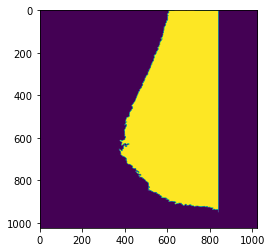

(100, 100)


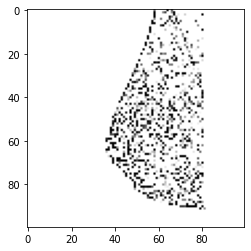

./all-mias/mdb008.pgm


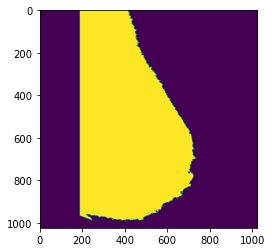

(100, 100)


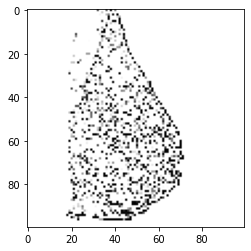

./all-mias/mdb009.pgm


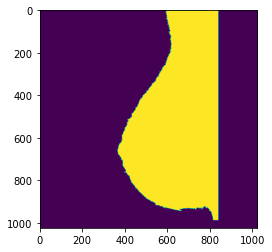

(100, 100)


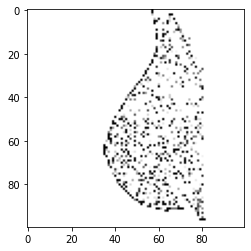

./all-mias/mdb010.pgm


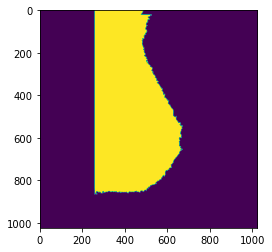

(100, 100)


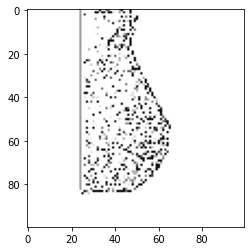

./all-mias/mdb011.pgm


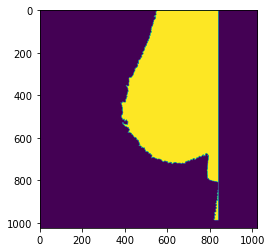

(100, 100)


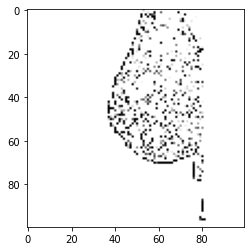

./all-mias/mdb012.pgm


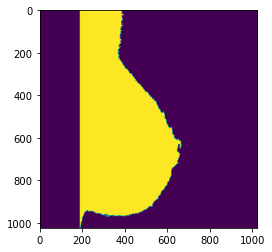

(100, 100)


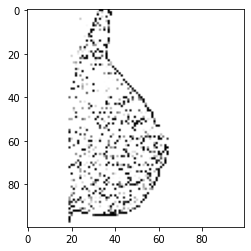

./all-mias/mdb013.pgm


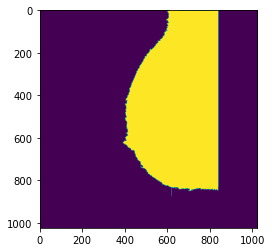

(100, 100)


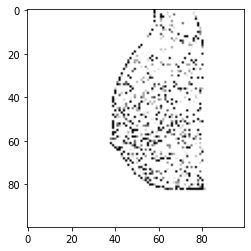

./all-mias/mdb014.pgm


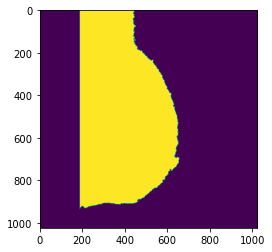

(100, 100)


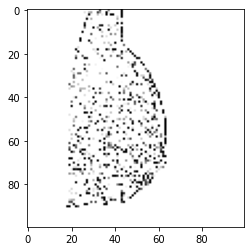

./all-mias/mdb015.pgm


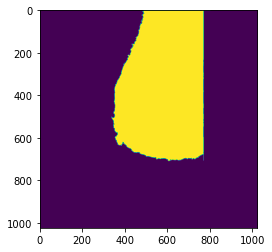

(100, 100)


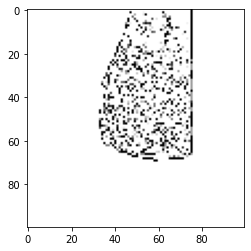

./all-mias/mdb016.pgm


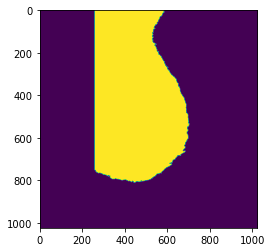

(100, 100)


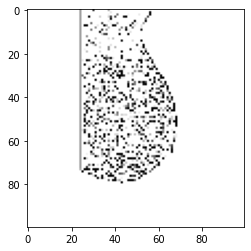

./all-mias/mdb017.pgm


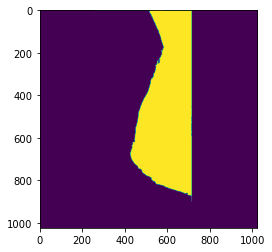

(100, 100)


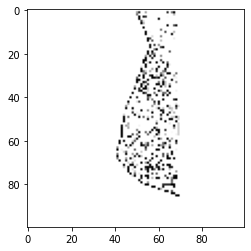

./all-mias/mdb018.pgm


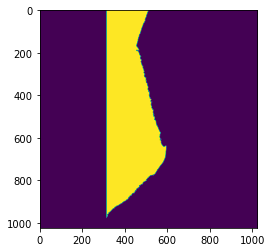

(100, 100)


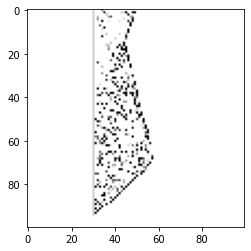

./all-mias/mdb019.pgm


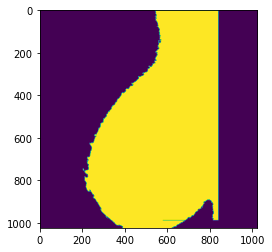

(100, 100)


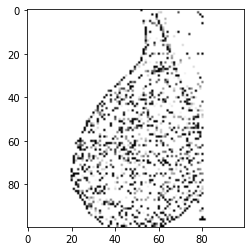

./all-mias/mdb020.pgm


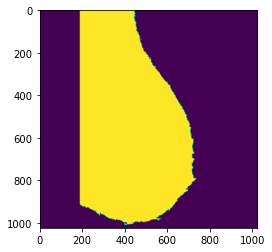

(100, 100)


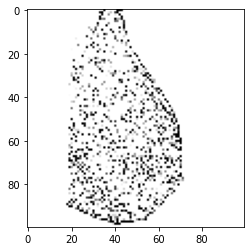

./all-mias/mdb021.pgm


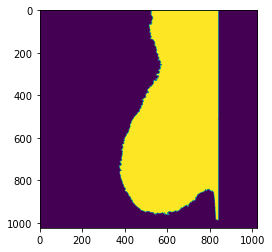

(100, 100)


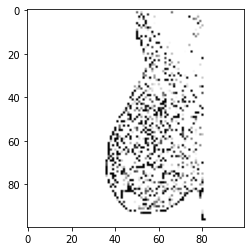

./all-mias/mdb022.pgm


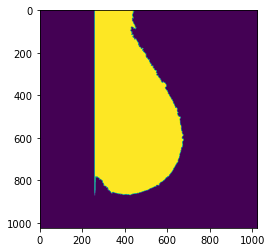

(100, 100)


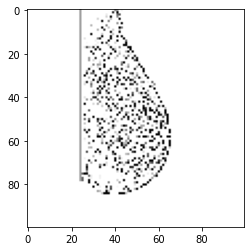

./all-mias/mdb023.pgm


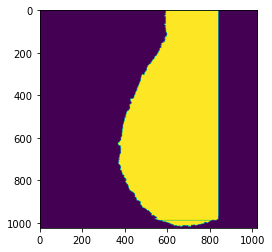

(100, 100)


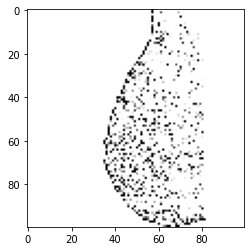

./all-mias/mdb024.pgm


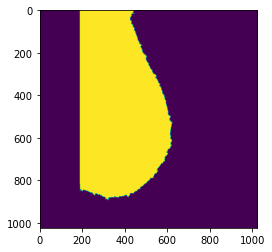

(100, 100)


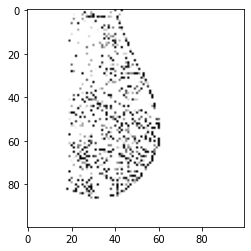

./all-mias/mdb025.pgm


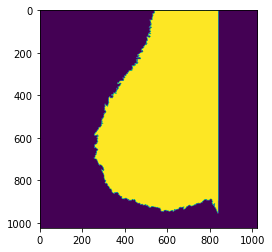

(100, 100)


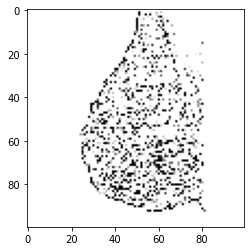

./all-mias/mdb026.pgm


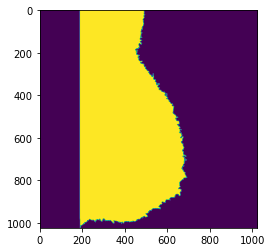

(100, 100)


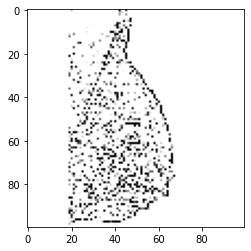

./all-mias/mdb027.pgm


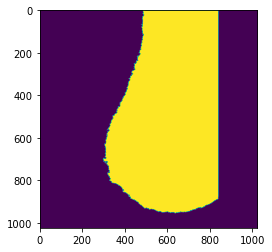

(100, 100)


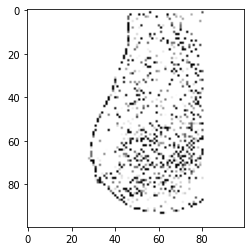

./all-mias/mdb028.pgm


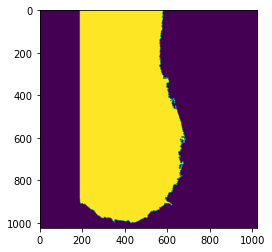

(100, 100)


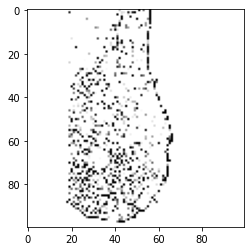

./all-mias/mdb029.pgm


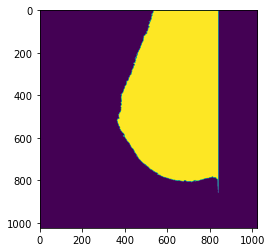

(100, 100)


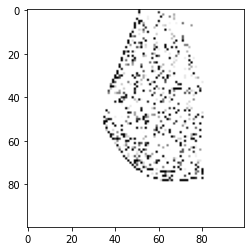

./all-mias/mdb030.pgm


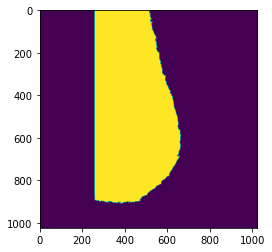

(100, 100)


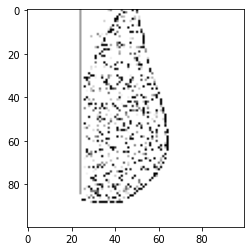

./all-mias/mdb031.pgm


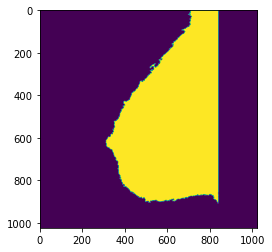

(100, 100)


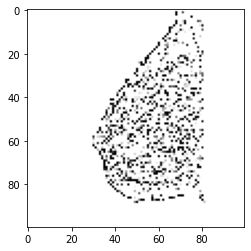

./all-mias/mdb032.pgm


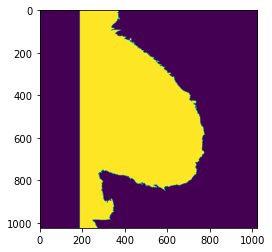

(100, 100)


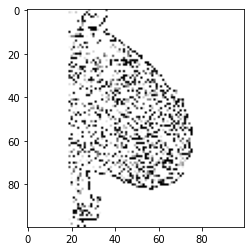

./all-mias/mdb033.pgm


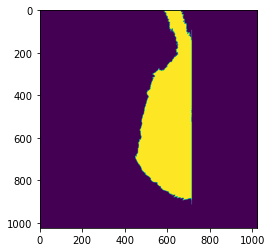

(100, 100)


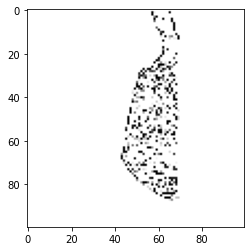

./all-mias/mdb034.pgm


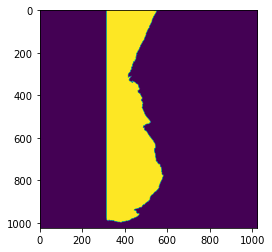

(100, 100)


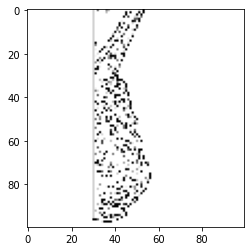

./all-mias/mdb035.pgm


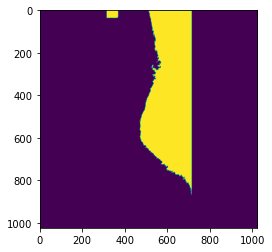

(100, 100)


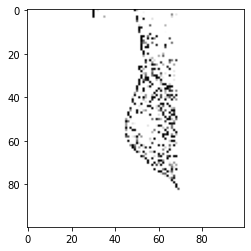

./all-mias/mdb036.pgm


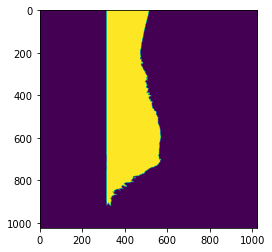

(100, 100)


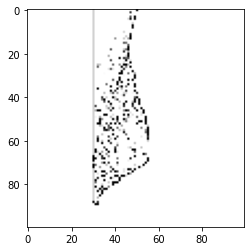

./all-mias/mdb037.pgm


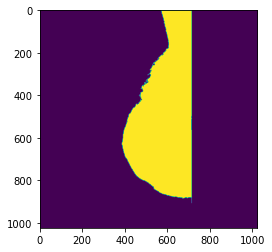

(100, 100)


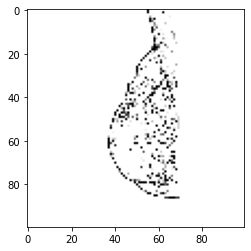

./all-mias/mdb038.pgm


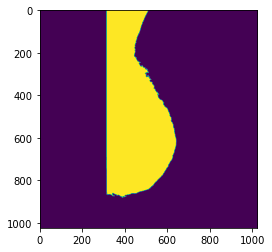

(100, 100)


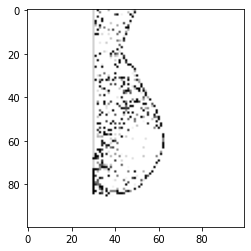

./all-mias/mdb039.pgm


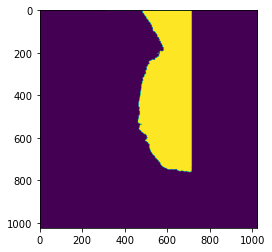

(100, 100)


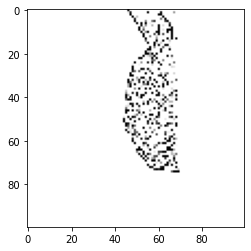

./all-mias/mdb040.pgm


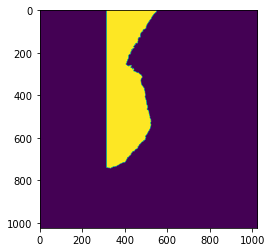

(100, 100)


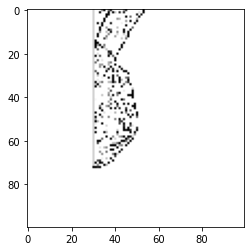

./all-mias/mdb041.pgm


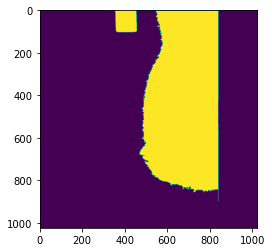

(100, 100)


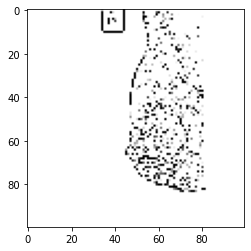

./all-mias/mdb042.pgm


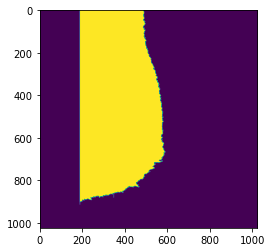

(100, 100)


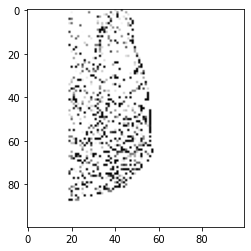

./all-mias/mdb043.pgm


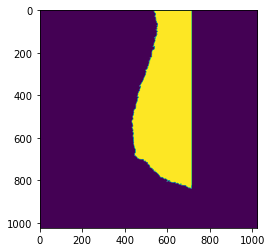

(100, 100)


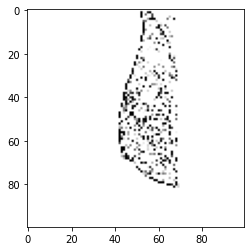

./all-mias/mdb044.pgm


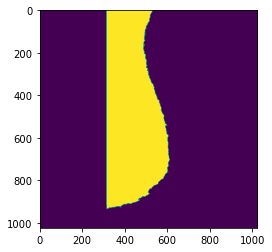

(100, 100)


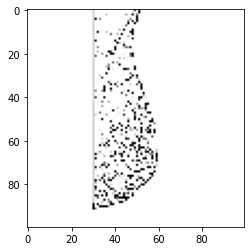

./all-mias/mdb045.pgm


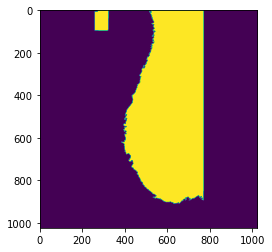

(100, 100)


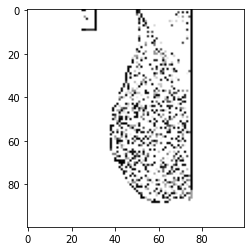

./all-mias/mdb046.pgm


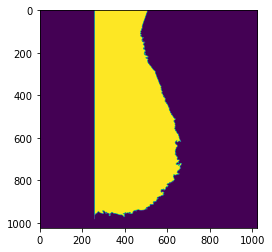

(100, 100)


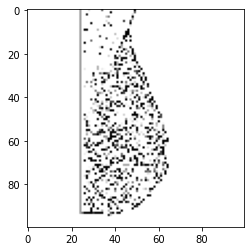

./all-mias/mdb047.pgm


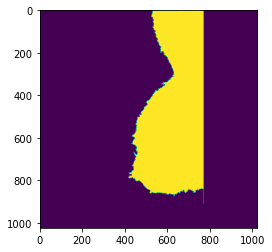

(100, 100)


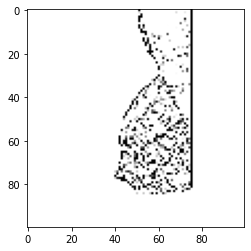

./all-mias/mdb048.pgm


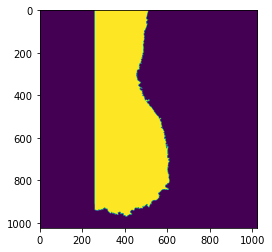

(100, 100)


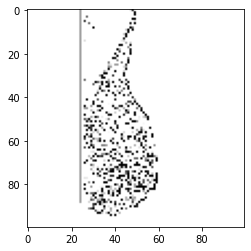

./all-mias/mdb049.pgm


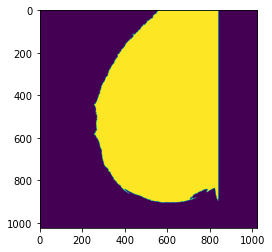

(100, 100)


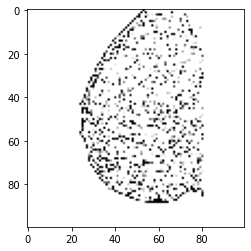

./all-mias/mdb050.pgm


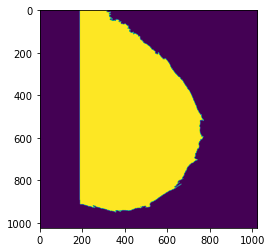

(100, 100)


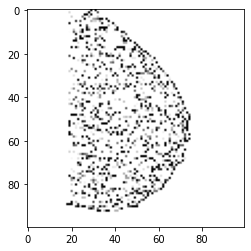

./all-mias/mdb051.pgm


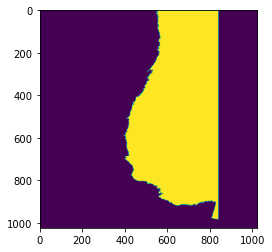

(100, 100)


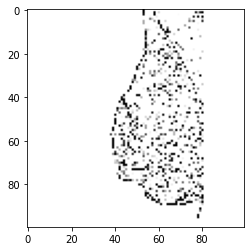

./all-mias/mdb052.pgm


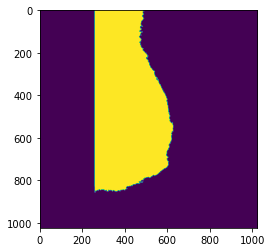

(100, 100)


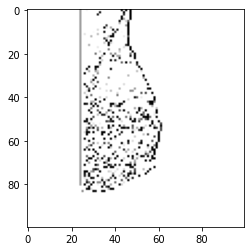

./all-mias/mdb053.pgm


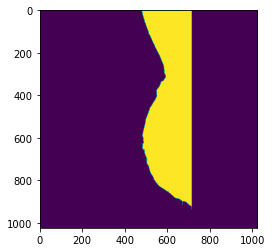

(100, 100)


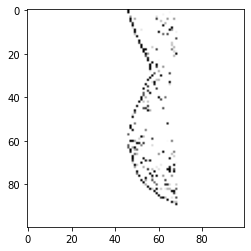

./all-mias/mdb054.pgm


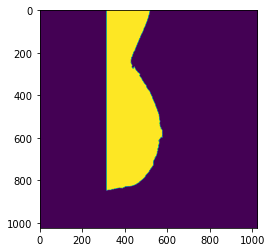

(100, 100)


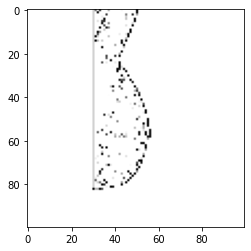

./all-mias/mdb055.pgm


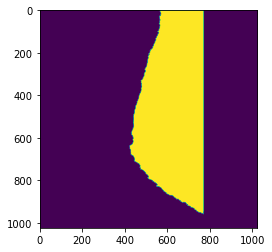

(100, 100)


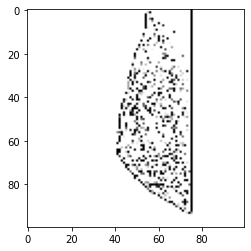

./all-mias/mdb056.pgm


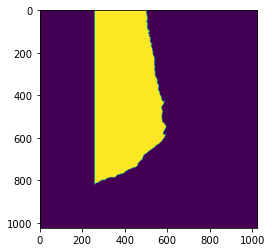

(100, 100)


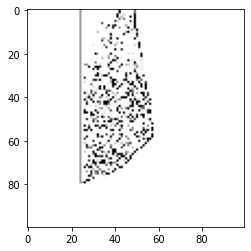

./all-mias/mdb057.pgm


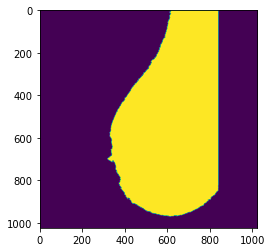

(100, 100)


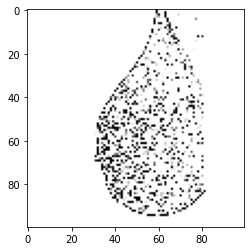

./all-mias/mdb058.pgm


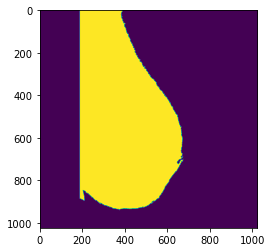

(100, 100)


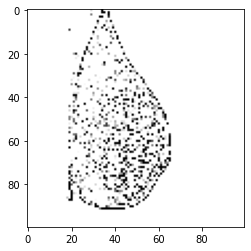

./all-mias/mdb059.pgm


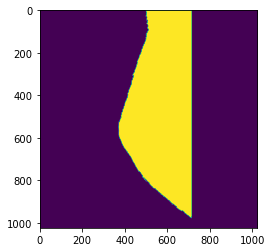

(100, 100)


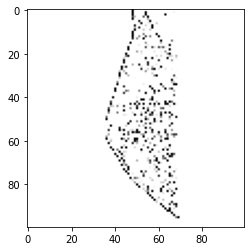

./all-mias/mdb060.pgm


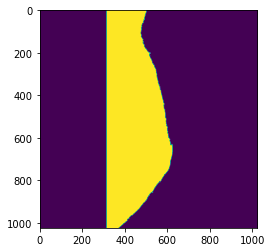

(100, 100)


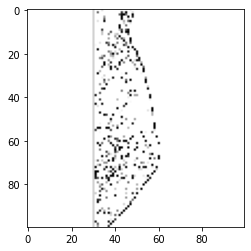

./all-mias/mdb061.pgm


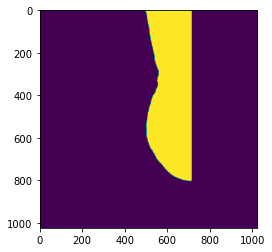

(100, 100)


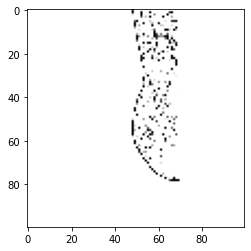

./all-mias/mdb062.pgm


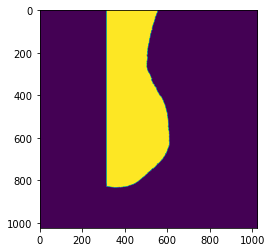

(100, 100)


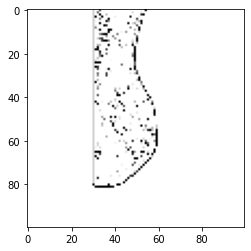

./all-mias/mdb063.pgm


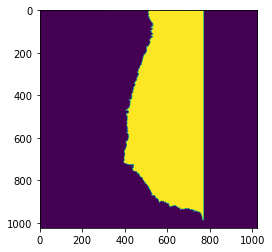

(100, 100)


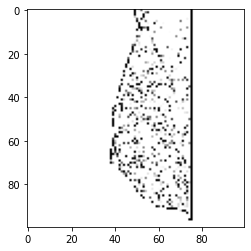

./all-mias/mdb064.pgm


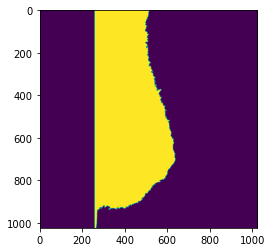

(100, 100)


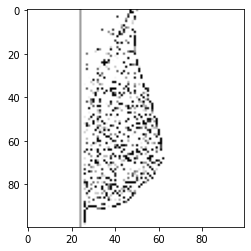

./all-mias/mdb065.pgm


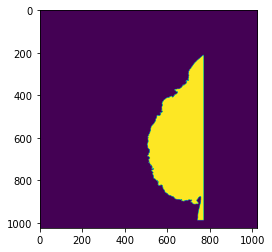

(100, 100)


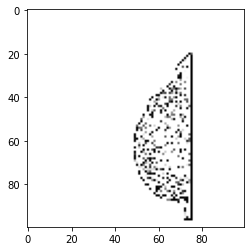

./all-mias/mdb066.pgm


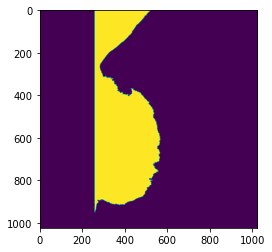

(100, 100)


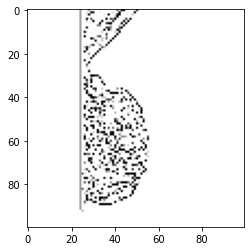

./all-mias/mdb067.pgm


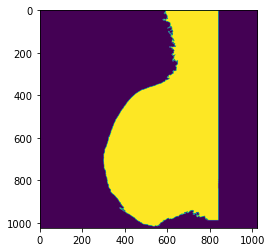

(100, 100)


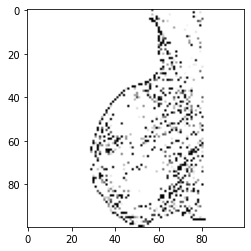

./all-mias/mdb068.pgm


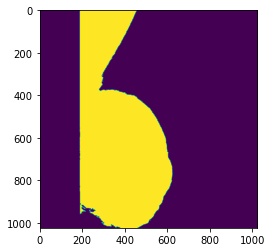

(100, 100)


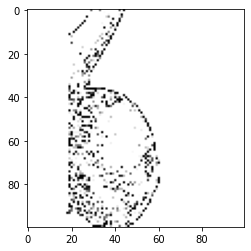

./all-mias/mdb069.pgm


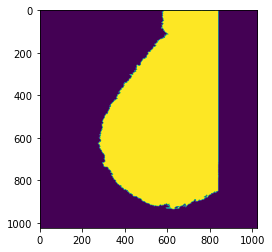

(100, 100)


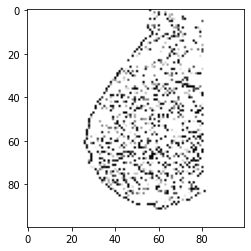

./all-mias/mdb070.pgm


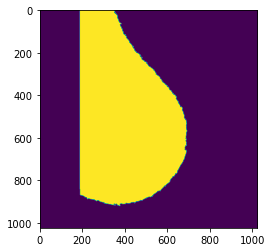

(100, 100)


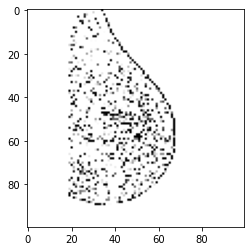

./all-mias/mdb071.pgm


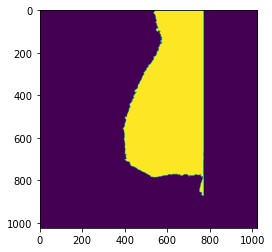

(100, 100)


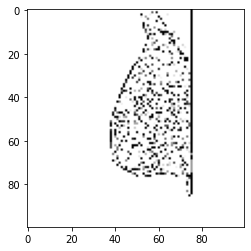

./all-mias/mdb072.pgm


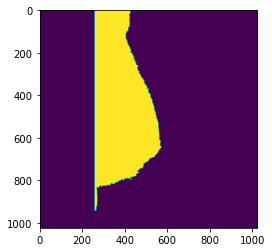

(100, 100)


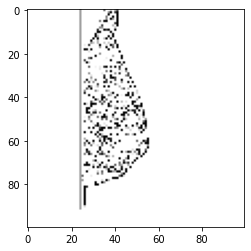

./all-mias/mdb073.pgm


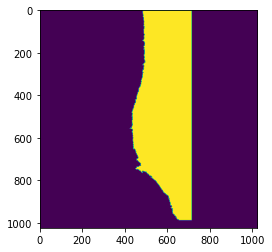

(100, 100)


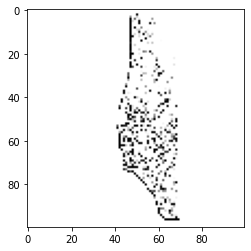

./all-mias/mdb074.pgm


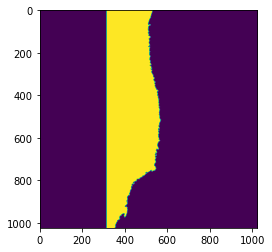

(100, 100)


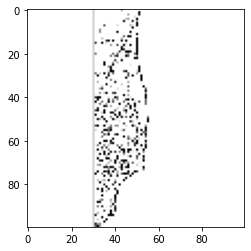

./all-mias/mdb075.pgm


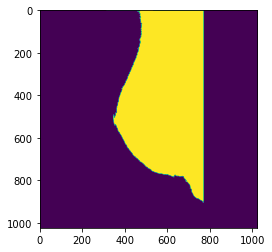

(100, 100)


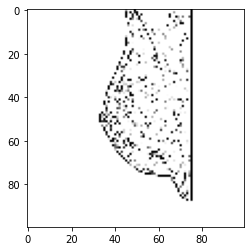

./all-mias/mdb076.pgm


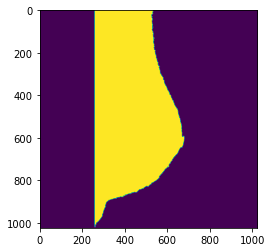

(100, 100)


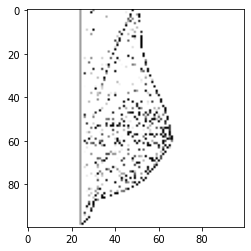

./all-mias/mdb077.pgm


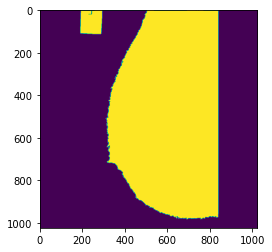

(100, 100)


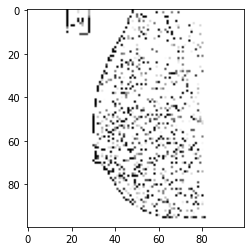

./all-mias/mdb078.pgm


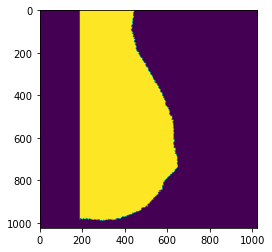

(100, 100)


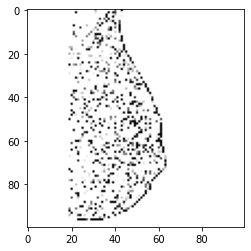

./all-mias/mdb079.pgm


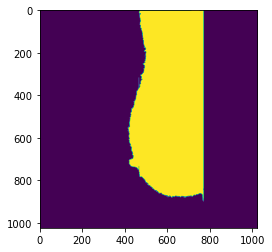

(100, 100)


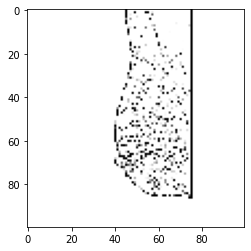

./all-mias/mdb080.pgm


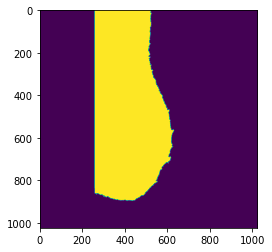

(100, 100)


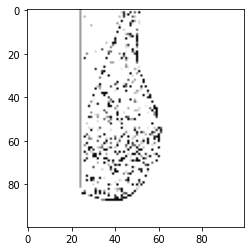

./all-mias/mdb081.pgm


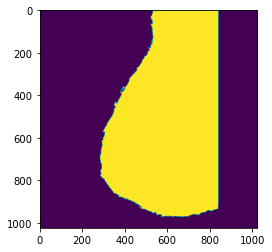

(100, 100)


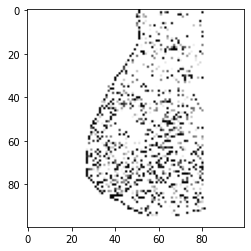

./all-mias/mdb082.pgm


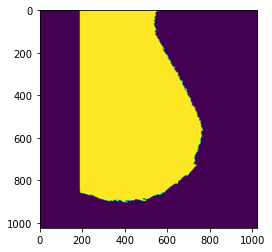

(100, 100)


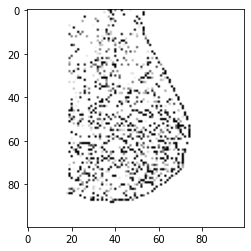

./all-mias/mdb083.pgm


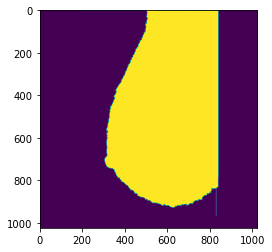

(100, 100)


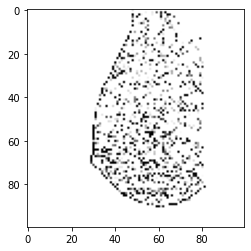

./all-mias/mdb084.pgm


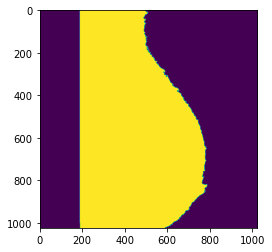

(100, 100)


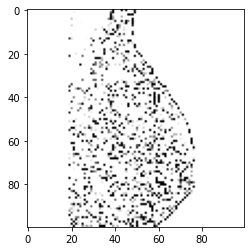

./all-mias/mdb085.pgm


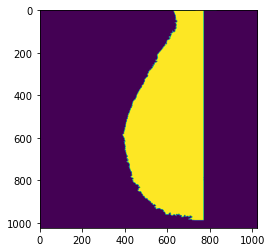

(100, 100)


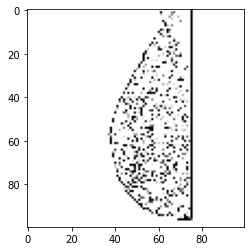

./all-mias/mdb086.pgm


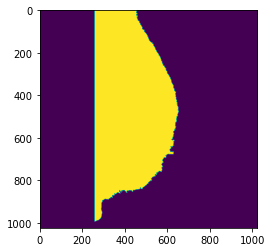

(100, 100)


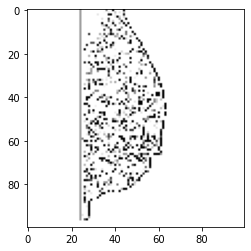

./all-mias/mdb087.pgm


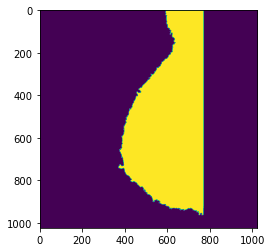

(100, 100)


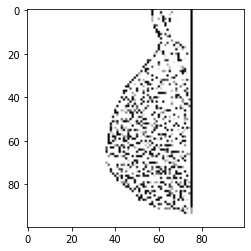

./all-mias/mdb088.pgm


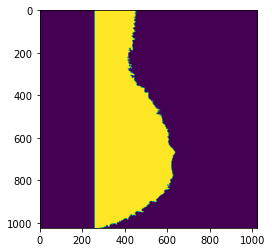

(100, 100)


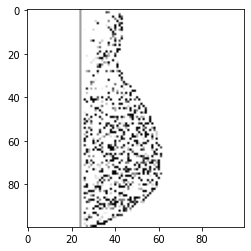

./all-mias/mdb089.pgm


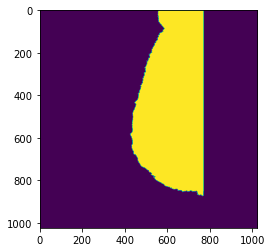

(100, 100)


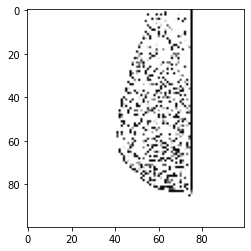

./all-mias/mdb090.pgm


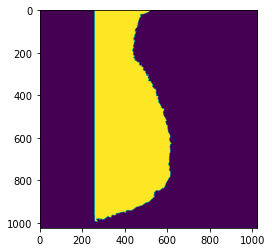

(100, 100)


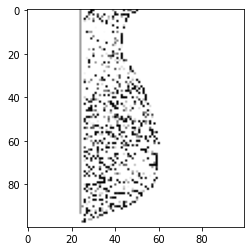

./all-mias/mdb091.pgm


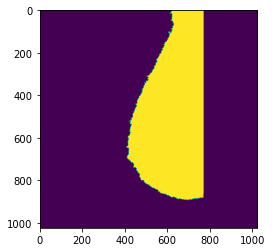

(100, 100)


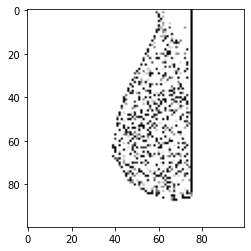

./all-mias/mdb092.pgm


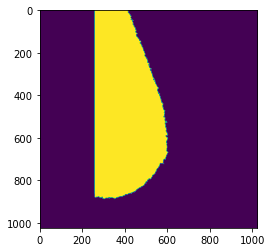

(100, 100)


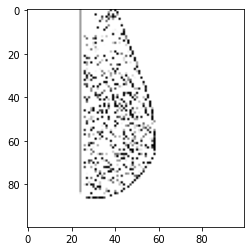

./all-mias/mdb093.pgm


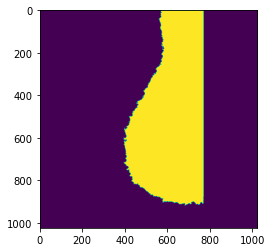

(100, 100)


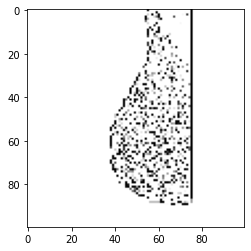

./all-mias/mdb094.pgm


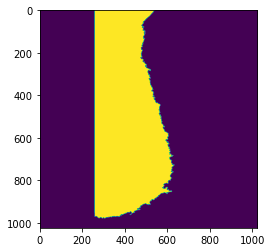

(100, 100)


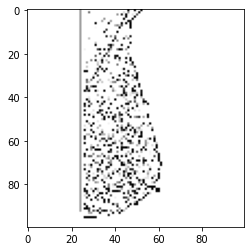

./all-mias/mdb095.pgm


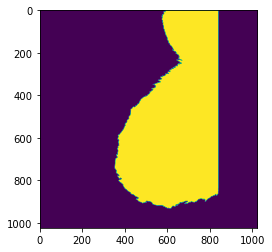

(100, 100)


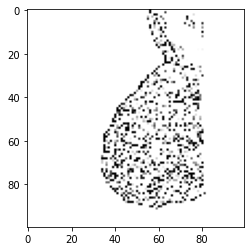

./all-mias/mdb096.pgm


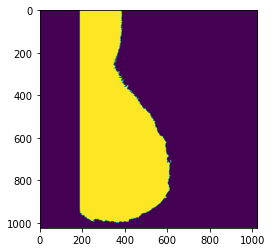

(100, 100)


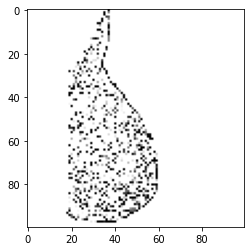

./all-mias/mdb097.pgm


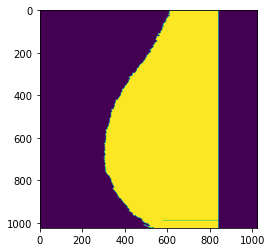

(100, 100)


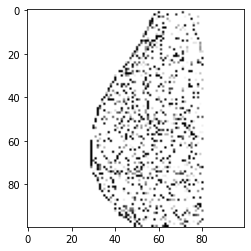

./all-mias/mdb098.pgm


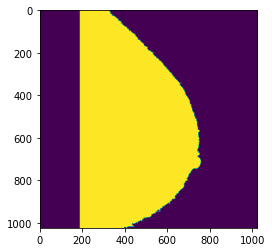

(100, 100)


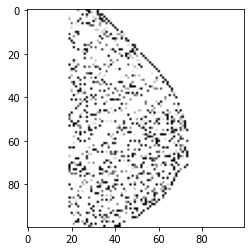

./all-mias/mdb099.pgm


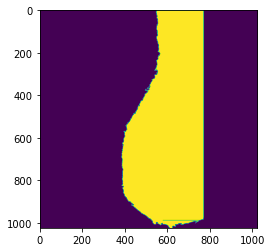

(100, 100)


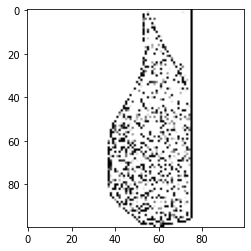

./all-mias/mdb100.pgm


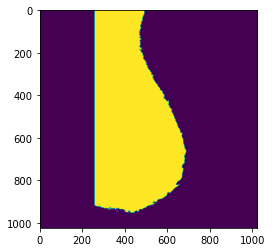

(100, 100)


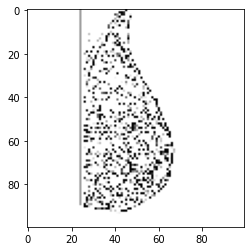

./all-mias/mdb101.pgm


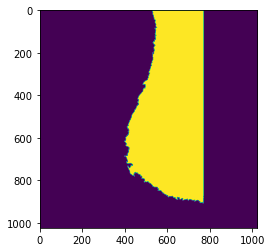

(100, 100)


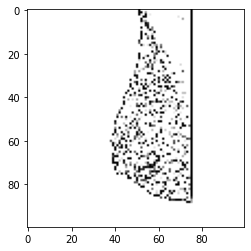

./all-mias/mdb102.pgm


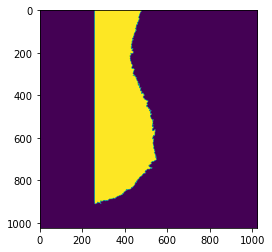

(100, 100)


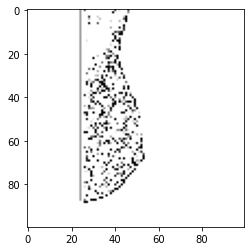

./all-mias/mdb103.pgm


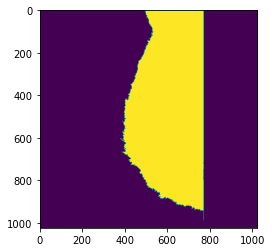

(100, 100)


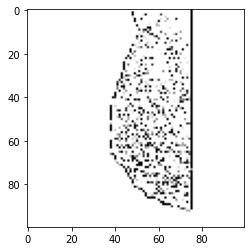

./all-mias/mdb104.pgm


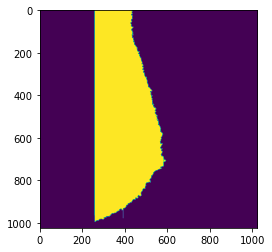

(100, 100)


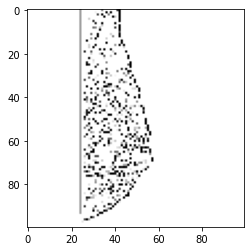

./all-mias/mdb105.pgm


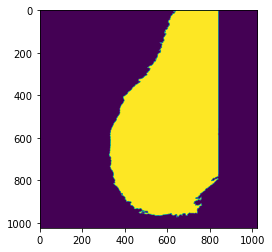

(100, 100)


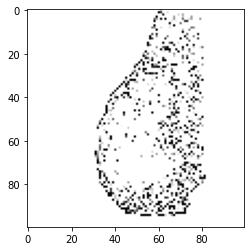

./all-mias/mdb106.pgm


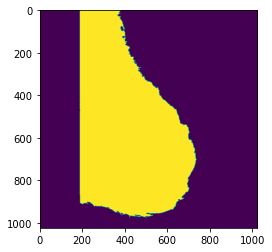

(100, 100)


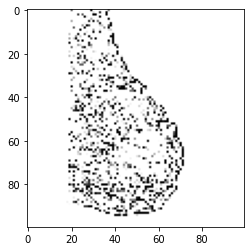

./all-mias/mdb107.pgm


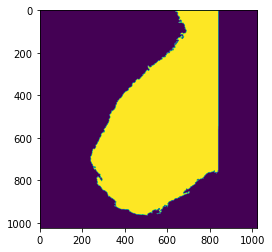

(100, 100)


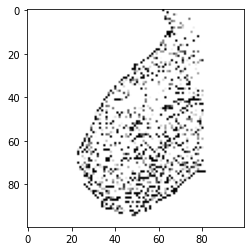

./all-mias/mdb108.pgm


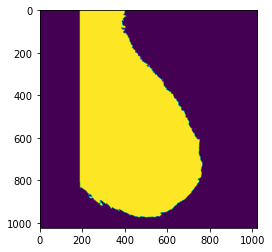

(100, 100)


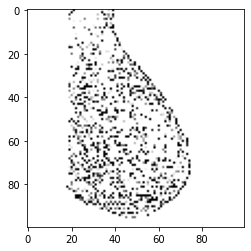

./all-mias/mdb109.pgm


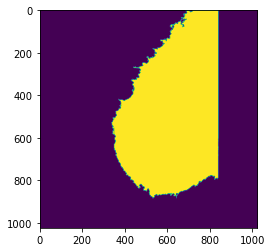

(100, 100)


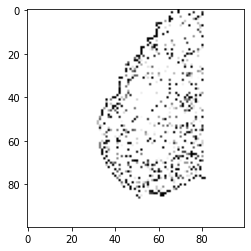

./all-mias/mdb110.pgm


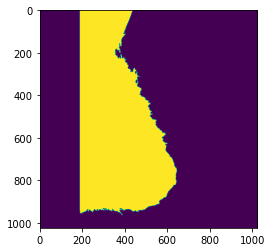

(100, 100)


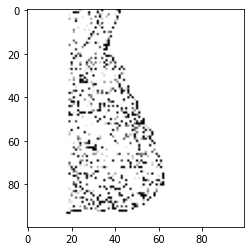

./all-mias/mdb111.pgm


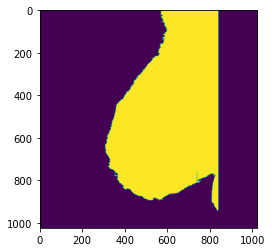

(100, 100)


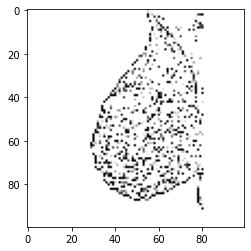

./all-mias/mdb112.pgm


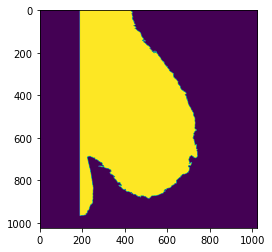

(100, 100)


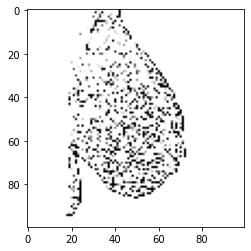

./all-mias/mdb113.pgm


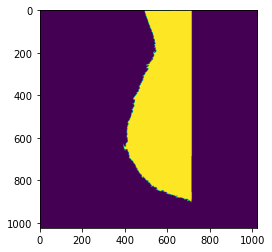

(100, 100)


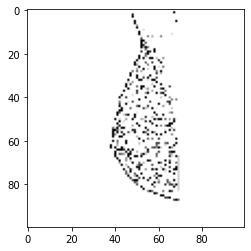

./all-mias/mdb114.pgm


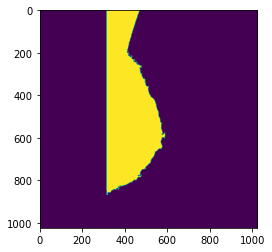

(100, 100)


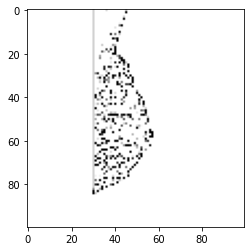

./all-mias/mdb115.pgm


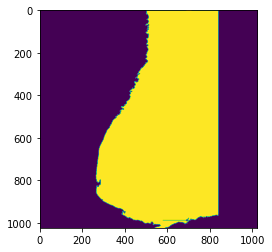

(100, 100)


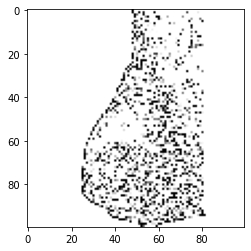

./all-mias/mdb116.pgm


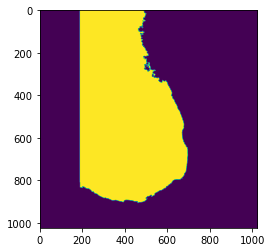

(100, 100)


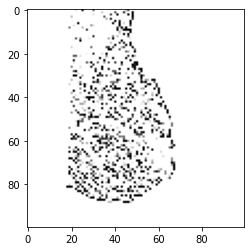

./all-mias/mdb117.pgm


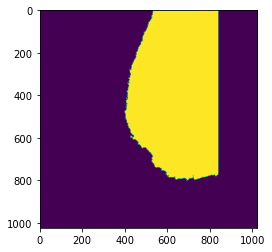

(100, 100)


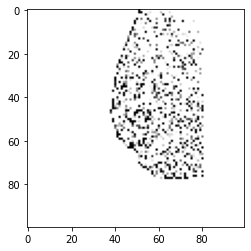

./all-mias/mdb118.pgm


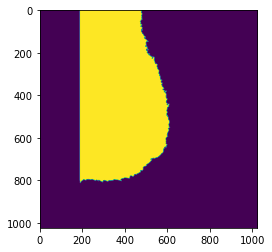

(100, 100)


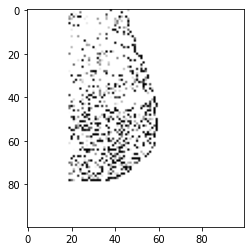

./all-mias/mdb119.pgm


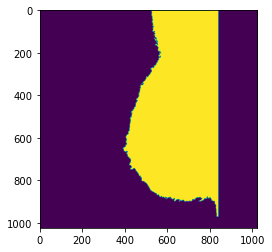

(100, 100)


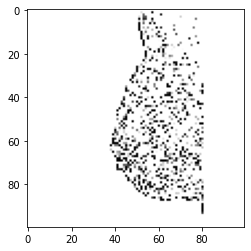

./all-mias/mdb120.pgm


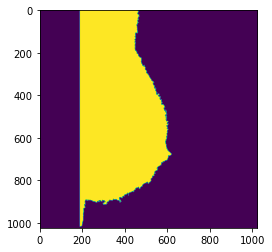

(100, 100)


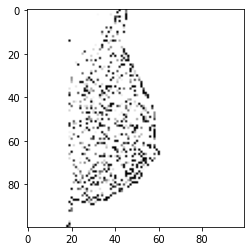

./all-mias/mdb121.pgm


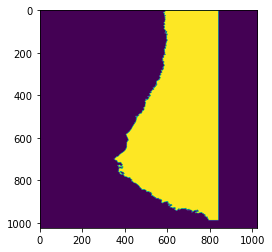

(100, 100)


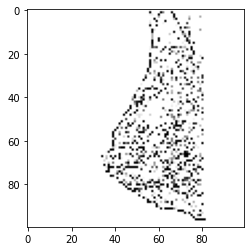

./all-mias/mdb122.pgm


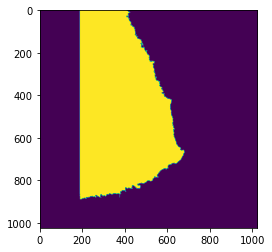

(100, 100)


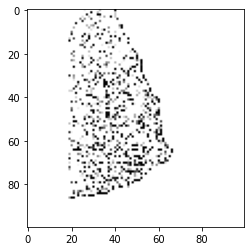

./all-mias/mdb123.pgm


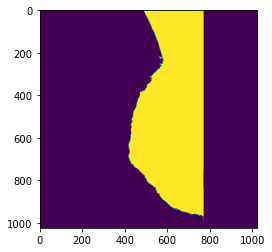

(100, 100)


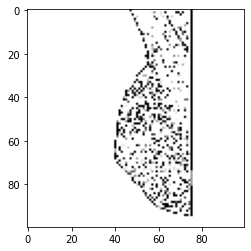

./all-mias/mdb124.pgm


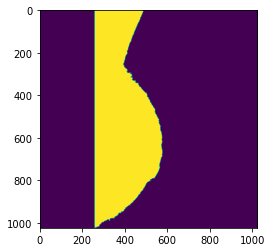

(100, 100)


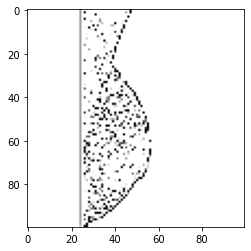

./all-mias/mdb125.pgm


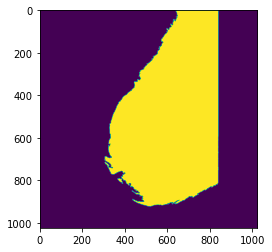

(100, 100)


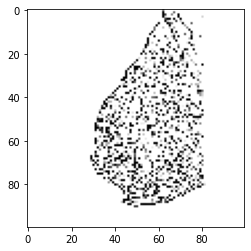

./all-mias/mdb126.pgm


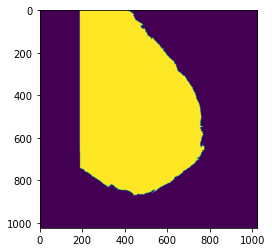

(100, 100)


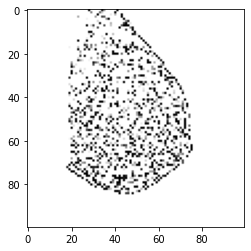

./all-mias/mdb127.pgm


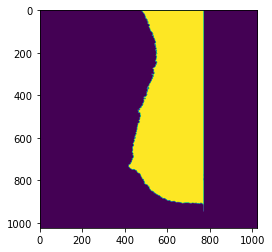

(100, 100)


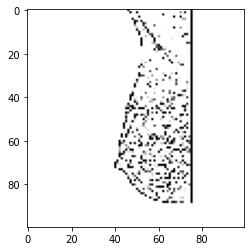

./all-mias/mdb128.pgm


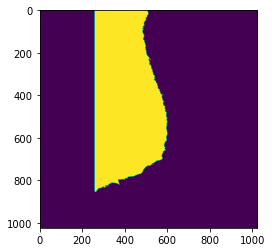

(100, 100)


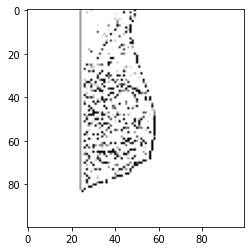

./all-mias/mdb129.pgm


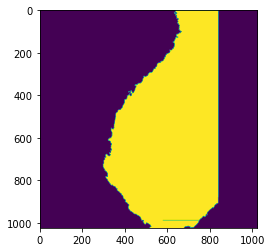

(100, 100)


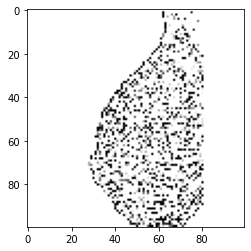

./all-mias/mdb130.pgm


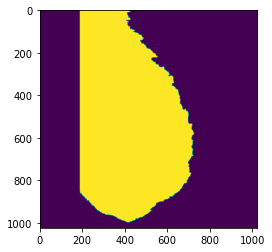

(100, 100)


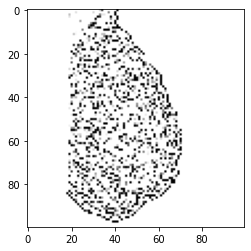

./all-mias/mdb131.pgm


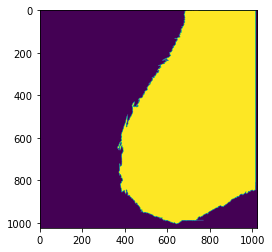

(100, 100)


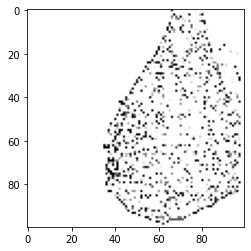

./all-mias/mdb132.pgm


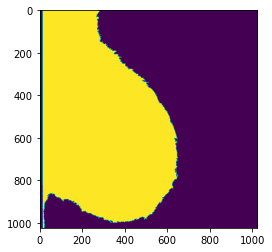

(100, 100)


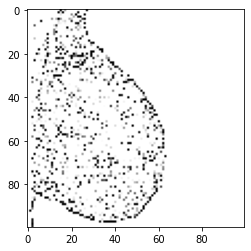

./all-mias/mdb133.pgm


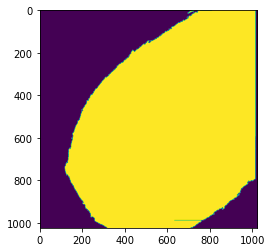

(100, 100)


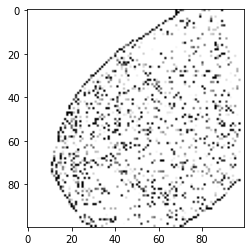

./all-mias/mdb134.pgm


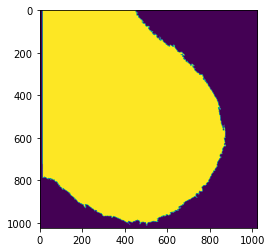

(100, 100)


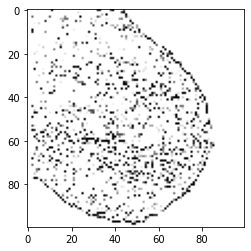

./all-mias/mdb135.pgm


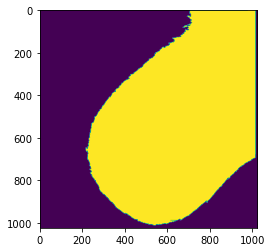

(100, 100)


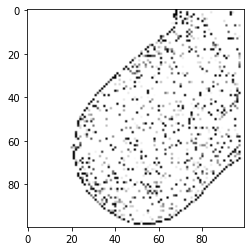

./all-mias/mdb136.pgm


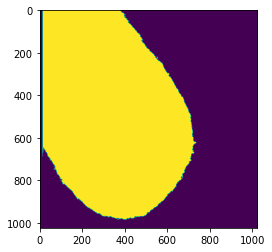

(100, 100)


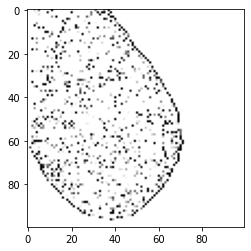

./all-mias/mdb137.pgm


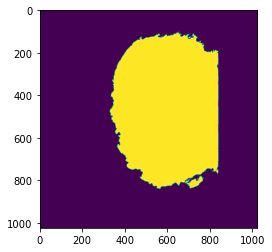

(100, 100)


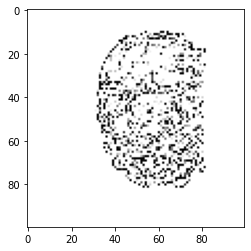

./all-mias/mdb138.pgm


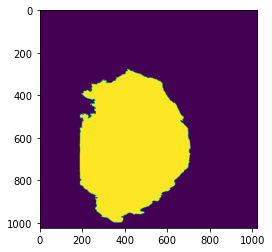

(100, 100)


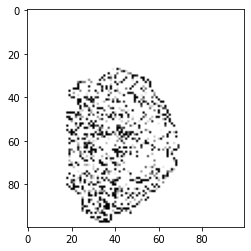

./all-mias/mdb139.pgm


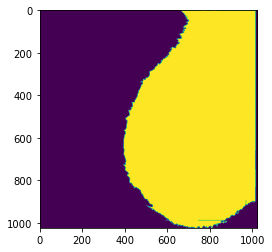

(100, 100)


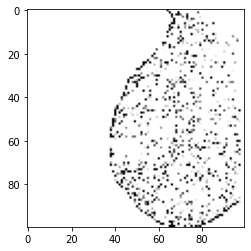

./all-mias/mdb140.pgm


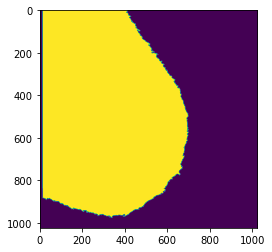

(100, 100)


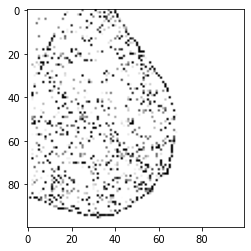

./all-mias/mdb141.pgm


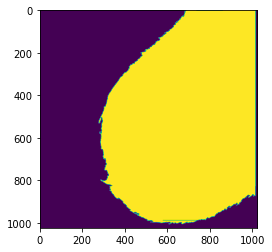

(100, 100)


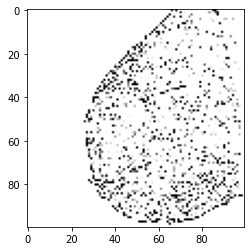

./all-mias/mdb142.pgm


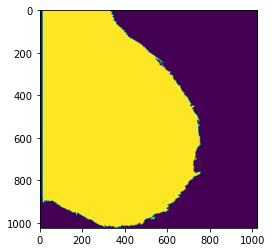

(100, 100)


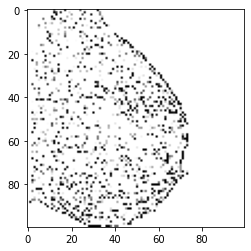

./all-mias/mdb143.pgm


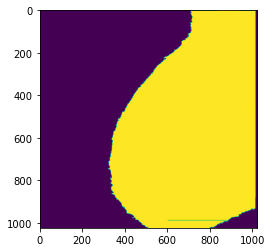

(100, 100)


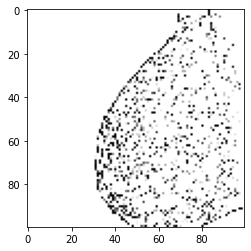

./all-mias/mdb144.pgm


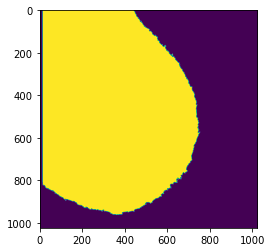

(100, 100)


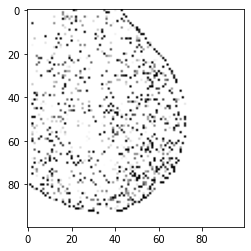

./all-mias/mdb145.pgm


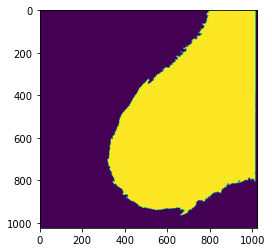

(100, 100)


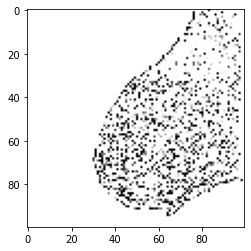

./all-mias/mdb146.pgm


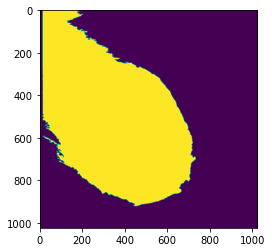

(100, 100)


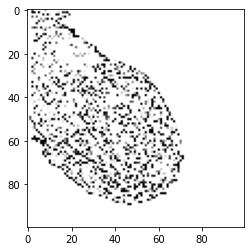

./all-mias/mdb147.pgm


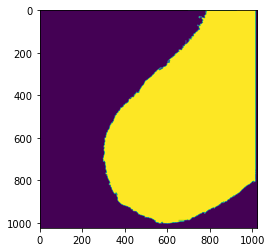

(100, 100)


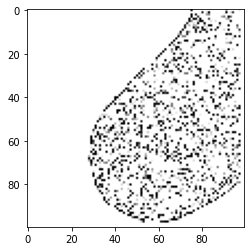

./all-mias/mdb148.pgm


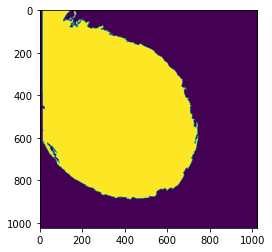

(100, 100)


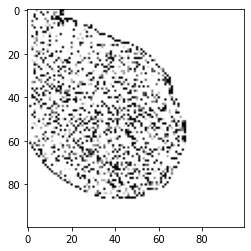

./all-mias/mdb149.pgm


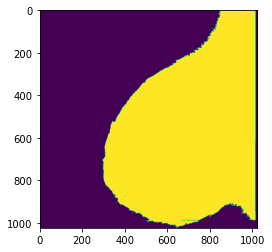

(100, 100)


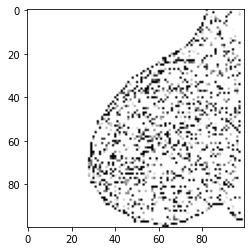

./all-mias/mdb150.pgm


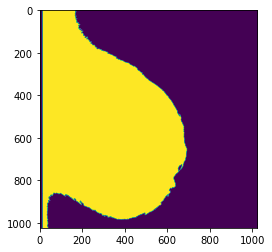

(100, 100)


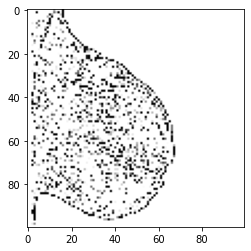

./all-mias/mdb151.pgm


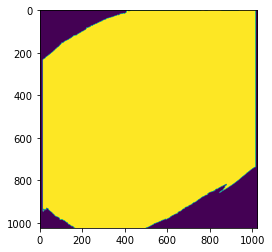

(100, 100)


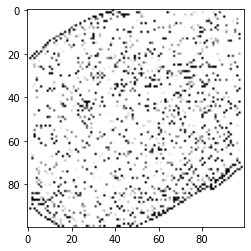

./all-mias/mdb152.pgm


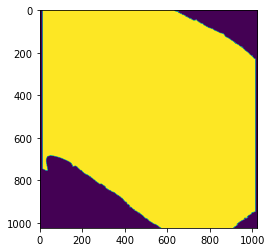

(100, 100)


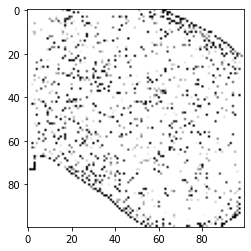

./all-mias/mdb153.pgm


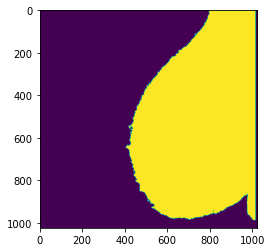

(100, 100)


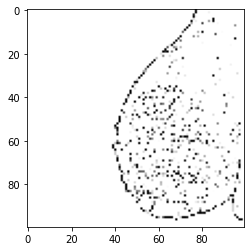

./all-mias/mdb154.pgm


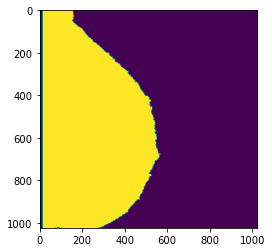

(100, 100)


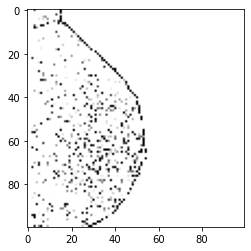

./all-mias/mdb155.pgm


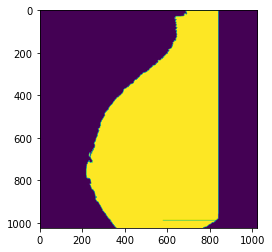

(100, 100)


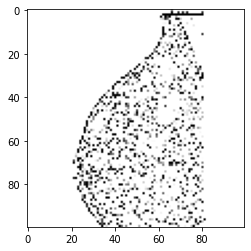

./all-mias/mdb156.pgm


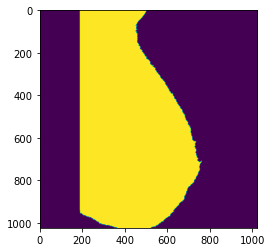

(100, 100)


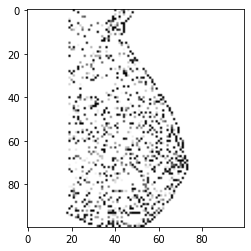

./all-mias/mdb157.pgm


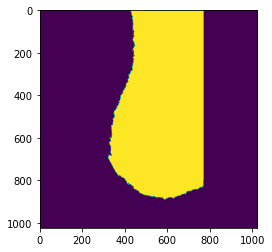

(100, 100)


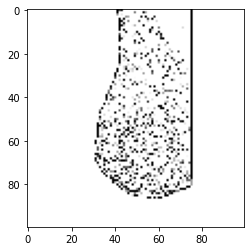

./all-mias/mdb158.pgm


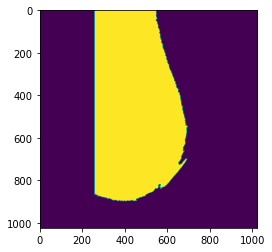

(100, 100)


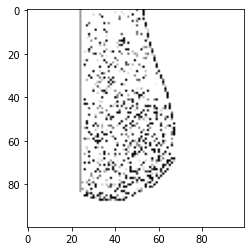

./all-mias/mdb159.pgm


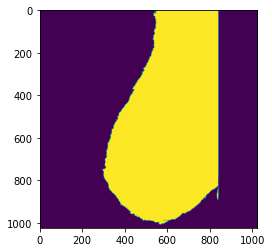

(100, 100)


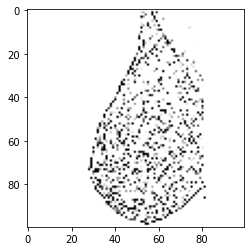

./all-mias/mdb160.pgm


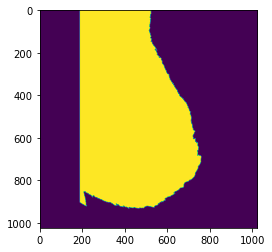

(100, 100)


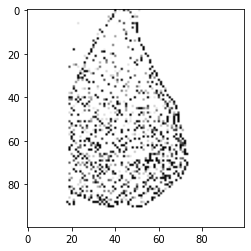

./all-mias/mdb161.pgm


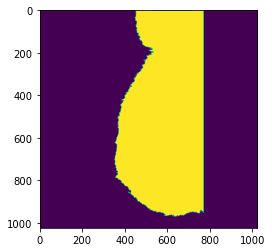

(100, 100)


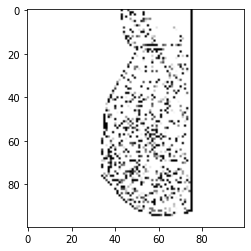

./all-mias/mdb162.pgm


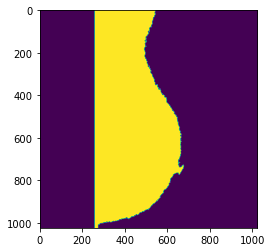

(100, 100)


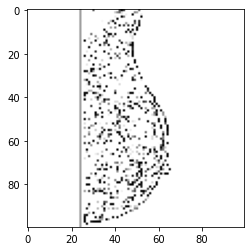

./all-mias/mdb163.pgm


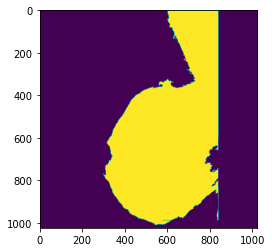

(100, 100)


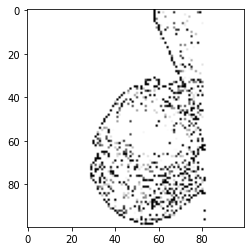

./all-mias/mdb164.pgm


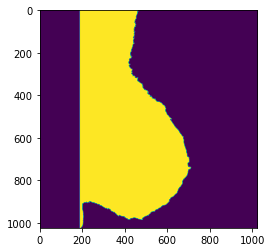

(100, 100)


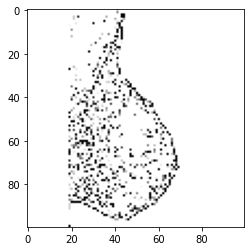

./all-mias/mdb165.pgm


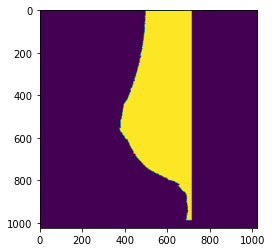

(100, 100)


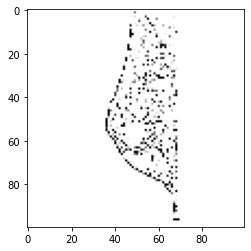

./all-mias/mdb166.pgm


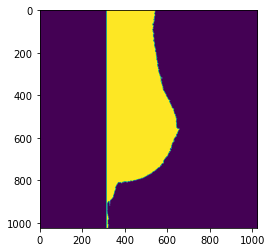

(100, 100)


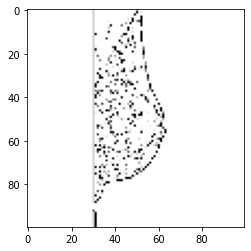

./all-mias/mdb167.pgm


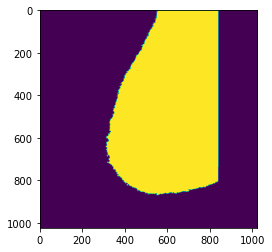

(100, 100)


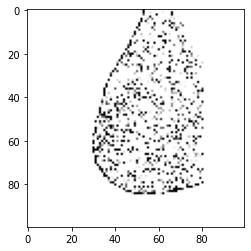

./all-mias/mdb168.pgm


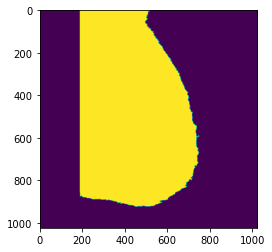

(100, 100)


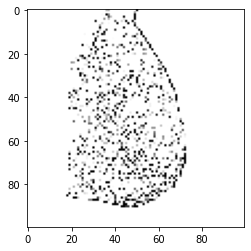

./all-mias/mdb169.pgm


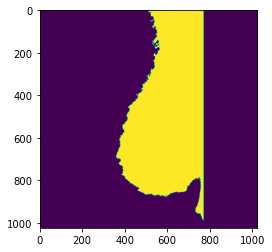

(100, 100)


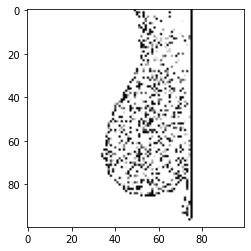

./all-mias/mdb170.pgm


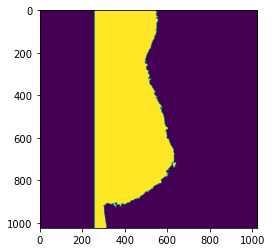

(100, 100)


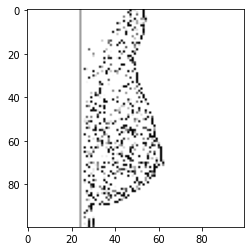

./all-mias/mdb171.pgm


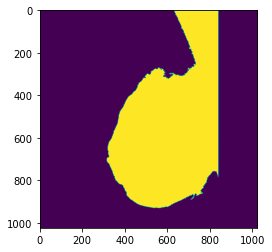

(100, 100)


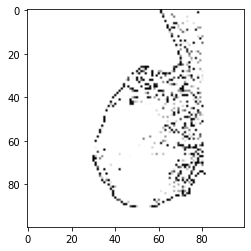

./all-mias/mdb172.pgm


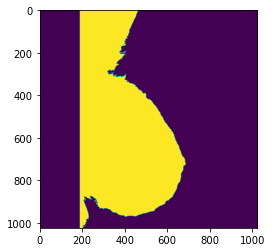

(100, 100)


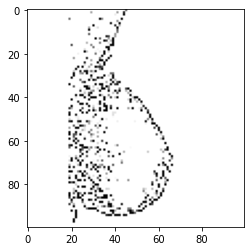

./all-mias/mdb173.pgm


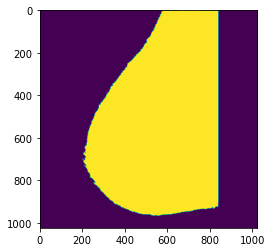

(100, 100)


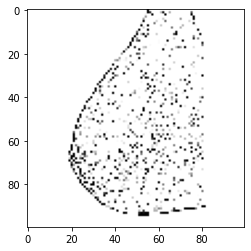

./all-mias/mdb174.pgm


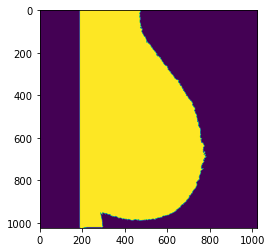

(100, 100)


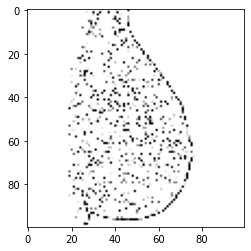

./all-mias/mdb175.pgm


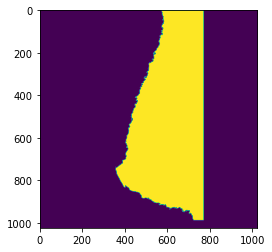

(100, 100)


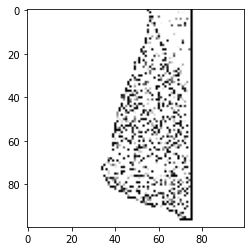

./all-mias/mdb176.pgm


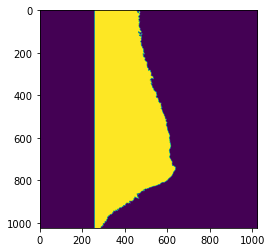

(100, 100)


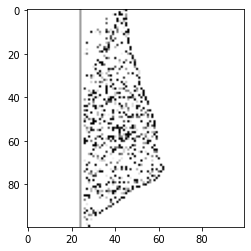

./all-mias/mdb177.pgm


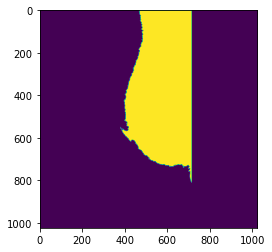

(100, 100)


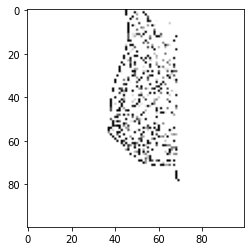

./all-mias/mdb178.pgm


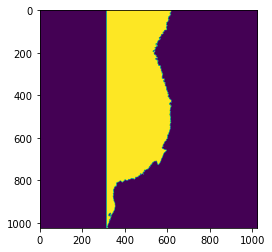

(100, 100)


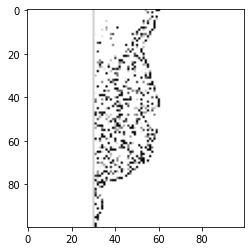

./all-mias/mdb179.pgm


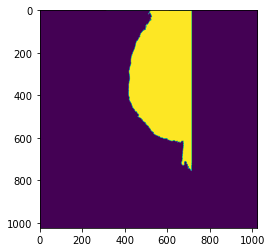

(100, 100)


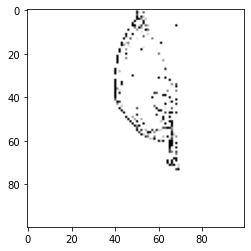

./all-mias/mdb180.pgm


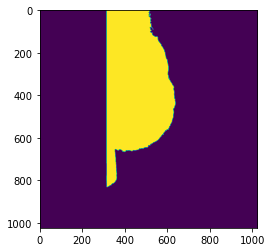

(100, 100)


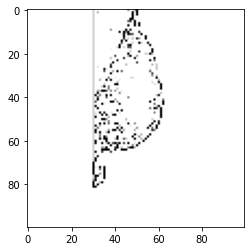

./all-mias/mdb181.pgm


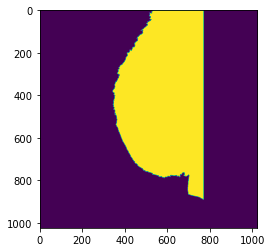

(100, 100)


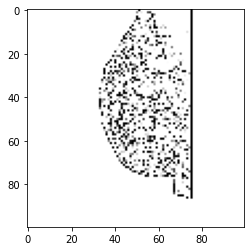

./all-mias/mdb182.pgm


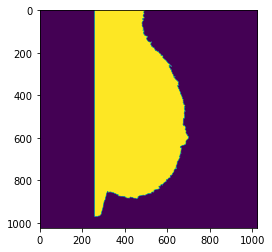

(100, 100)


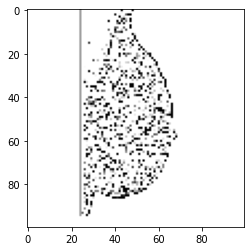

./all-mias/mdb183.pgm


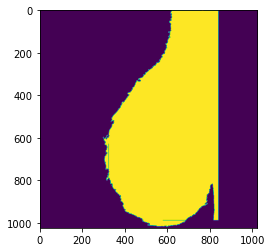

(100, 100)


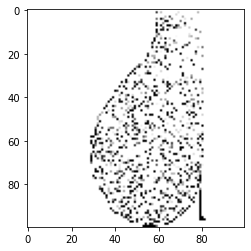

./all-mias/mdb184.pgm


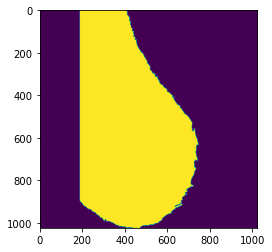

(100, 100)


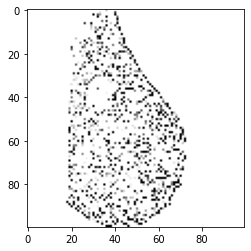

./all-mias/mdb185.pgm


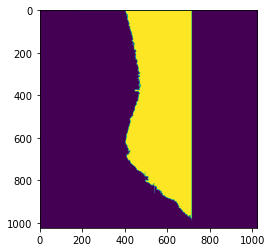

(100, 100)


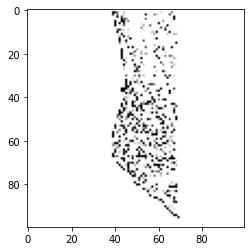

./all-mias/mdb186.pgm


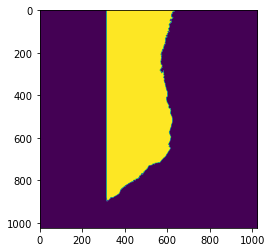

(100, 100)


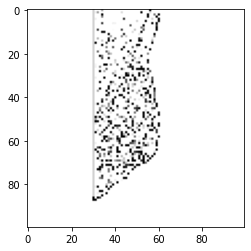

./all-mias/mdb187.pgm


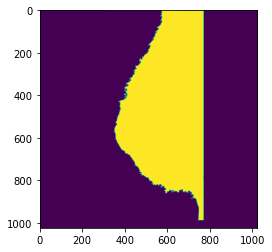

(100, 100)


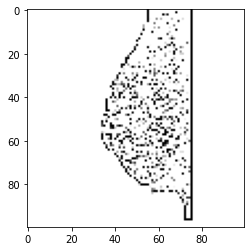

./all-mias/mdb188.pgm


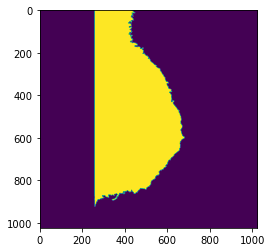

(100, 100)


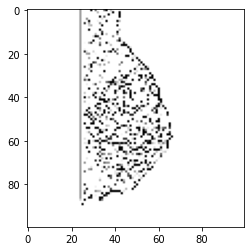

./all-mias/mdb189.pgm


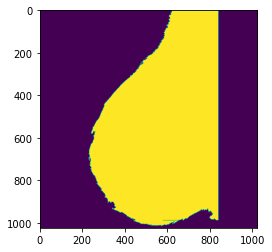

(100, 100)


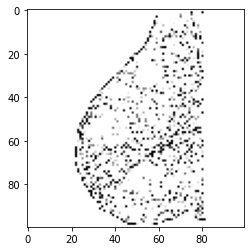

./all-mias/mdb190.pgm


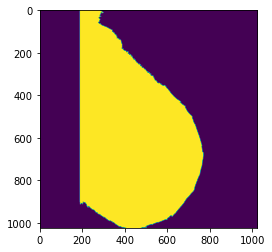

(100, 100)


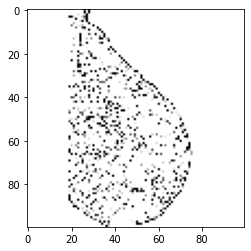

./all-mias/mdb191.pgm


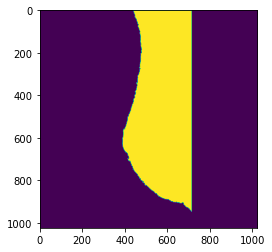

(100, 100)


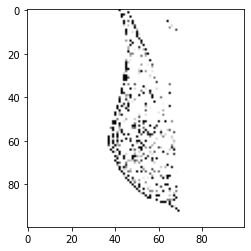

./all-mias/mdb192.pgm


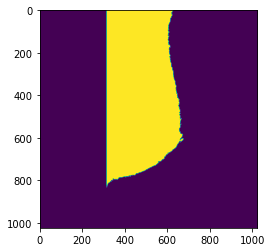

(100, 100)


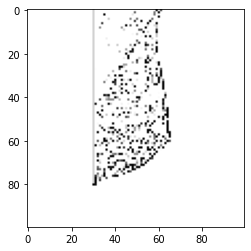

./all-mias/mdb193.pgm


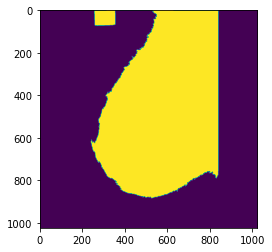

(100, 100)


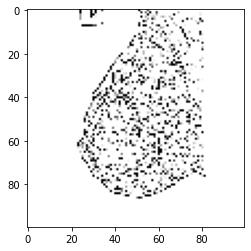

./all-mias/mdb194.pgm


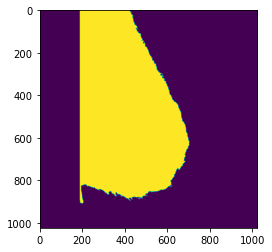

(100, 100)


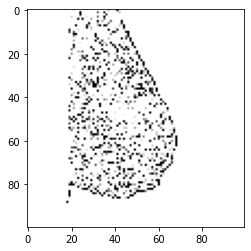

./all-mias/mdb195.pgm


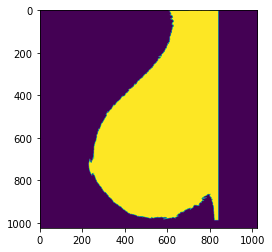

(100, 100)


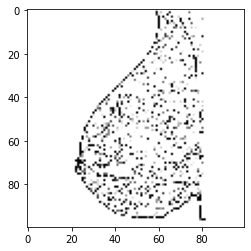

./all-mias/mdb196.pgm


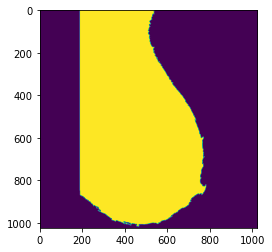

(100, 100)


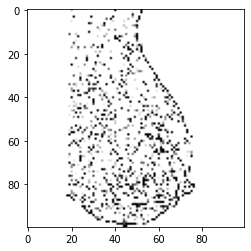

./all-mias/mdb197.pgm


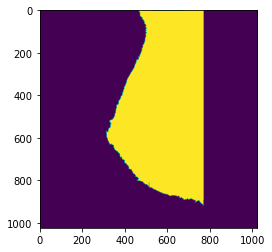

(100, 100)


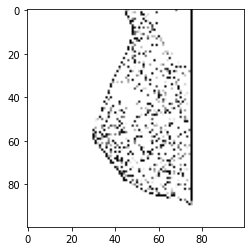

./all-mias/mdb198.pgm


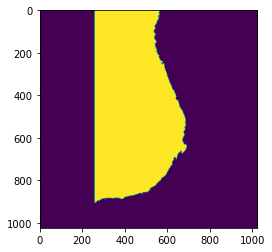

(100, 100)


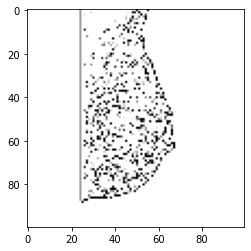

./all-mias/mdb199.pgm


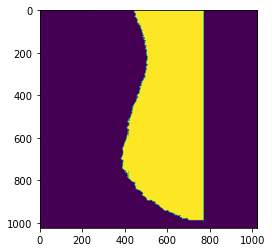

(100, 100)


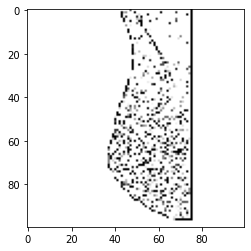

./all-mias/mdb200.pgm


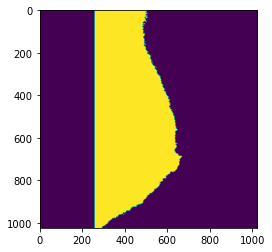

(100, 100)


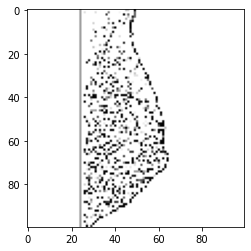

./all-mias/mdb201.pgm


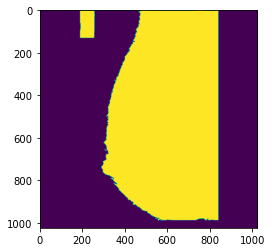

(100, 100)


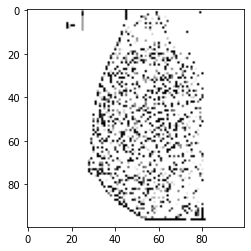

./all-mias/mdb202.pgm


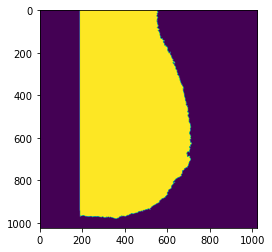

(100, 100)


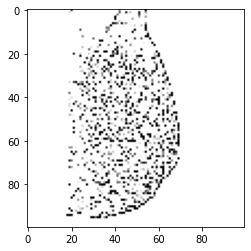

./all-mias/mdb203.pgm


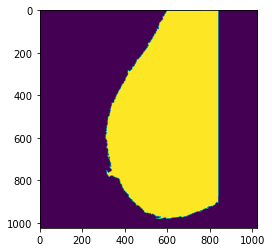

(100, 100)


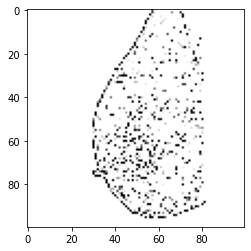

./all-mias/mdb204.pgm


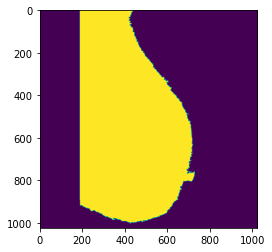

(100, 100)


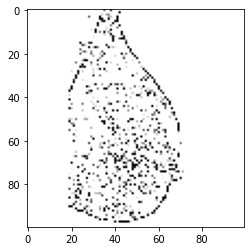

./all-mias/mdb205.pgm


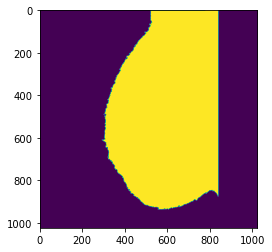

(100, 100)


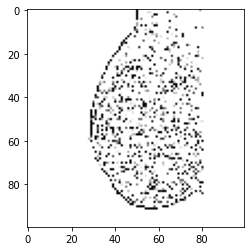

./all-mias/mdb206.pgm


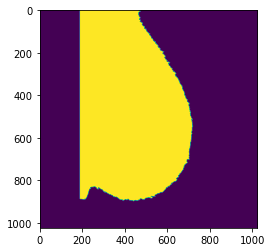

(100, 100)


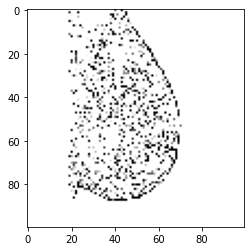

./all-mias/mdb207.pgm


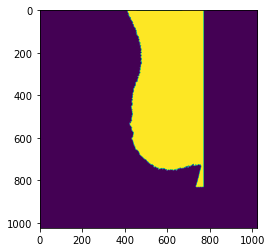

(100, 100)


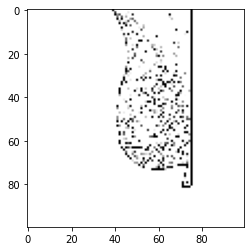

./all-mias/mdb208.pgm


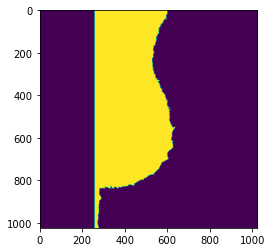

(100, 100)


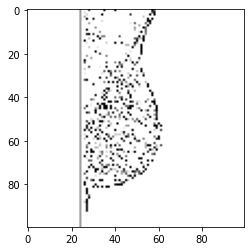

./all-mias/mdb209.pgm


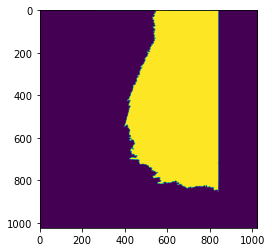

(100, 100)


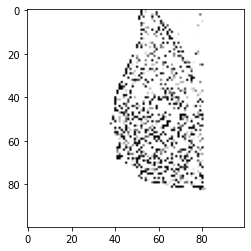

./all-mias/mdb210.pgm


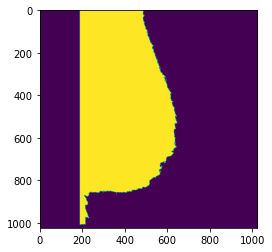

(100, 100)


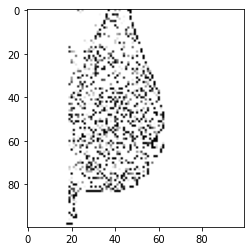

./all-mias/mdb211.pgm


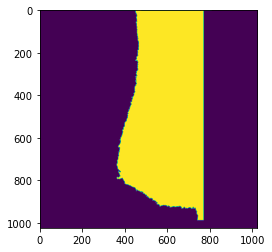

(100, 100)


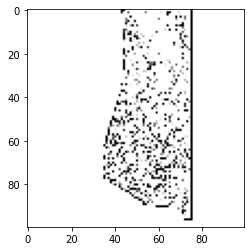

./all-mias/mdb212.pgm


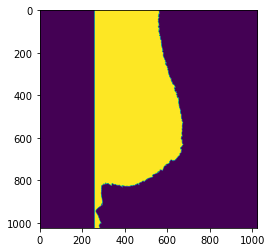

(100, 100)


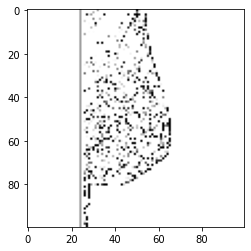

./all-mias/mdb213.pgm


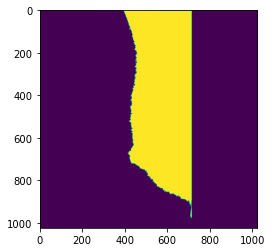

(100, 100)


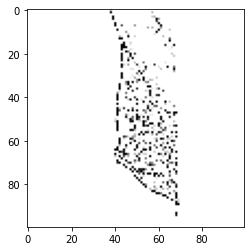

./all-mias/mdb214.pgm


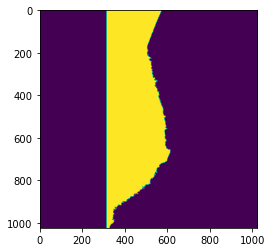

(100, 100)


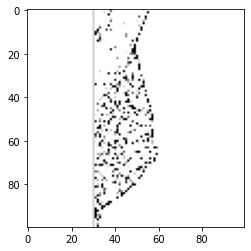

./all-mias/mdb215.pgm


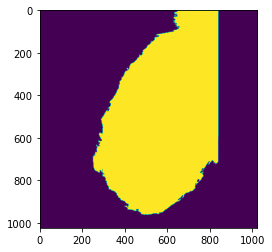

(100, 100)


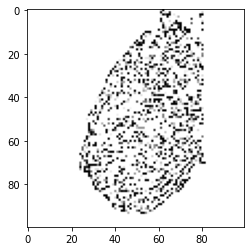

./all-mias/mdb216.pgm


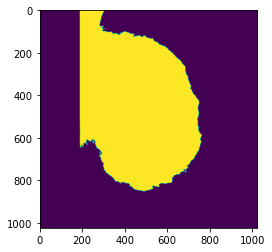

(100, 100)


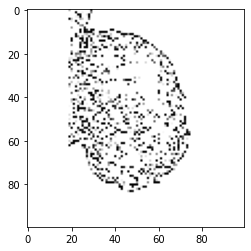

./all-mias/mdb217.pgm


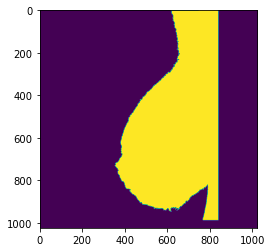

(100, 100)


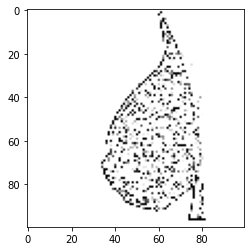

./all-mias/mdb218.pgm


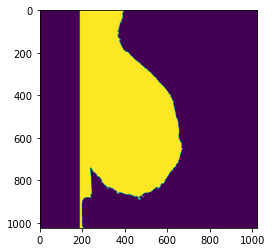

(100, 100)


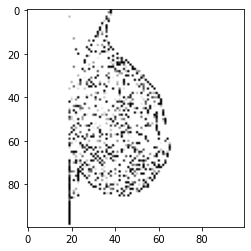

./all-mias/mdb219.pgm


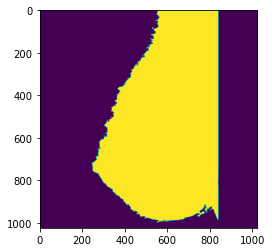

(100, 100)


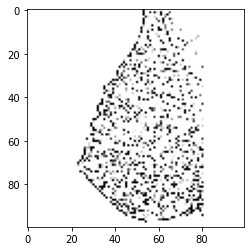

./all-mias/mdb220.pgm


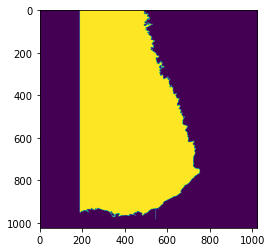

(100, 100)


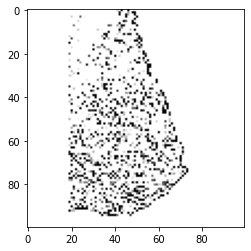

./all-mias/mdb221.pgm


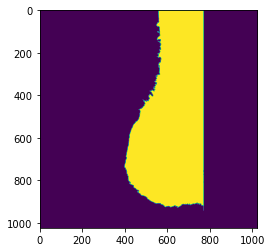

(100, 100)


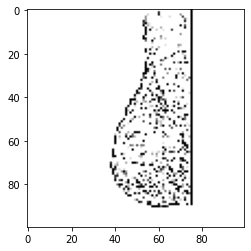

./all-mias/mdb222.pgm


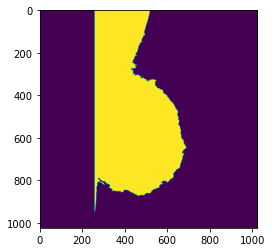

(100, 100)


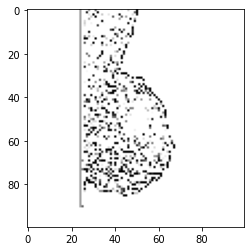

./all-mias/mdb223.pgm


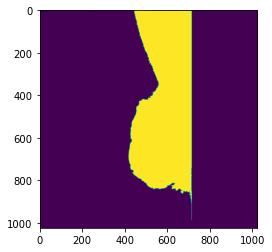

(100, 100)


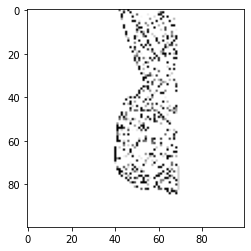

./all-mias/mdb224.pgm


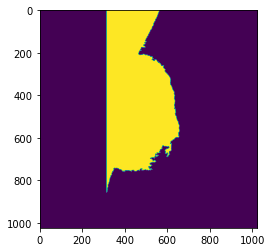

(100, 100)


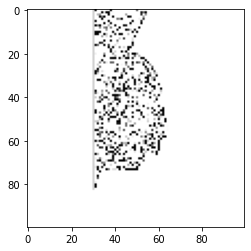

./all-mias/mdb225.pgm


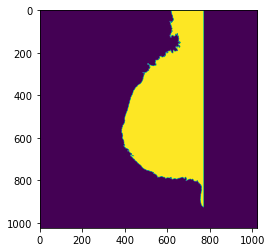

(100, 100)


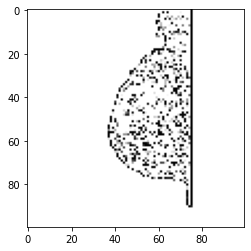

./all-mias/mdb226.pgm


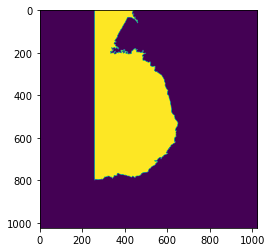

(100, 100)


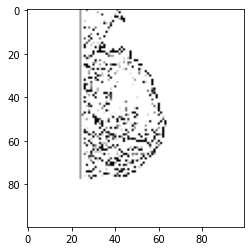

./all-mias/mdb227.pgm


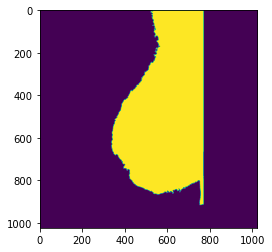

(100, 100)


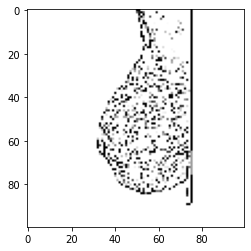

./all-mias/mdb228.pgm


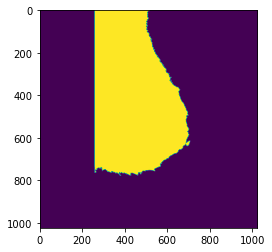

(100, 100)


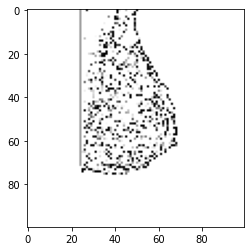

./all-mias/mdb229.pgm


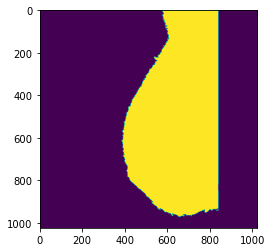

(100, 100)


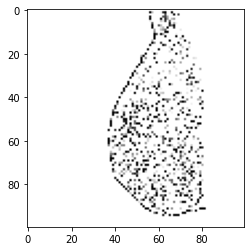

./all-mias/mdb230.pgm


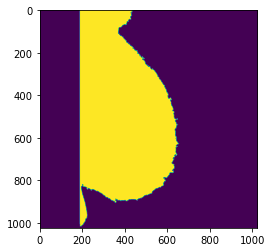

(100, 100)


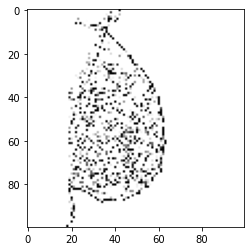

./all-mias/mdb231.pgm


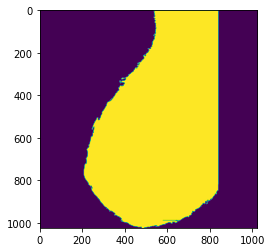

(100, 100)


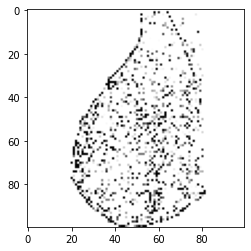

./all-mias/mdb232.pgm


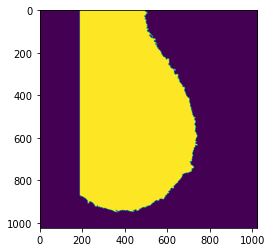

(100, 100)


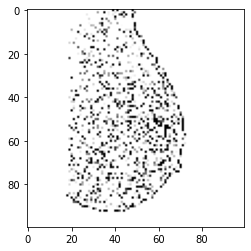

./all-mias/mdb233.pgm


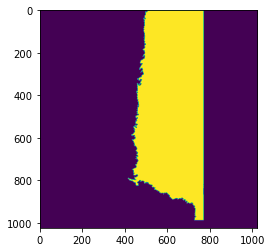

(100, 100)


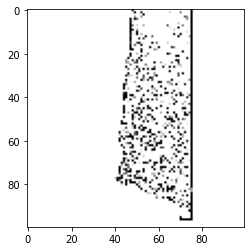

./all-mias/mdb234.pgm


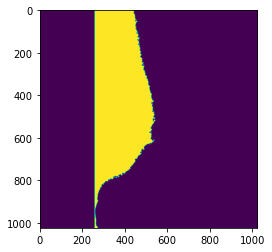

(100, 100)


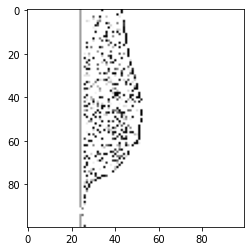

./all-mias/mdb235.pgm


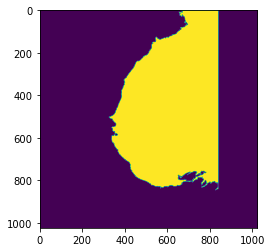

(100, 100)


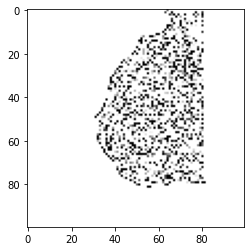

./all-mias/mdb236.pgm


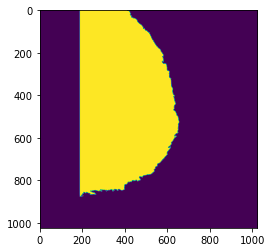

(100, 100)


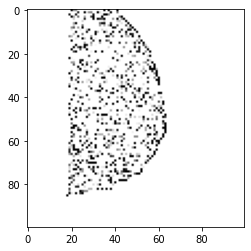

./all-mias/mdb237.pgm


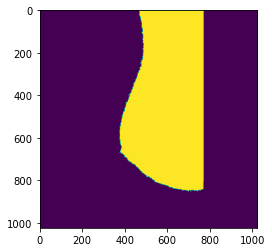

(100, 100)


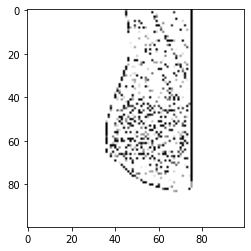

./all-mias/mdb238.pgm


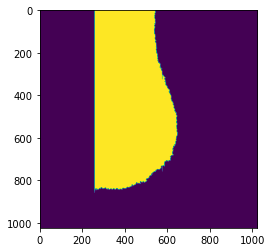

(100, 100)


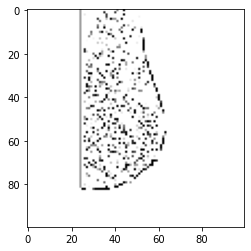

./all-mias/mdb239.pgm


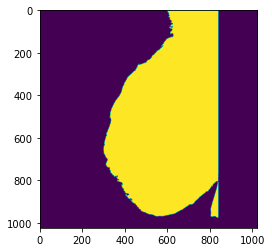

(100, 100)


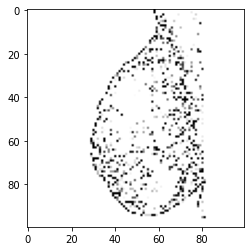

./all-mias/mdb240.pgm


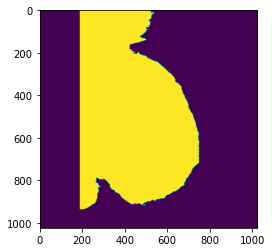

(100, 100)


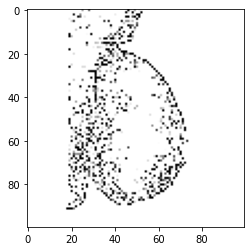

./all-mias/mdb241.pgm


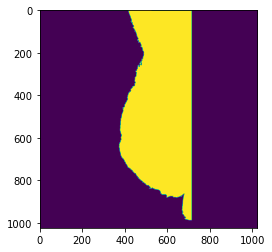

(100, 100)


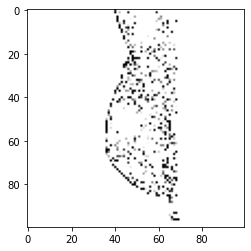

./all-mias/mdb242.pgm


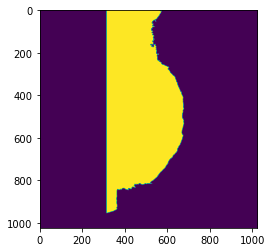

(100, 100)


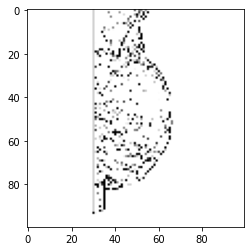

./all-mias/mdb243.pgm


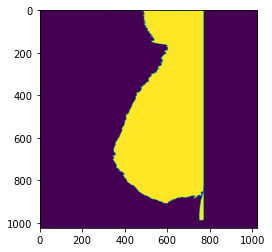

(100, 100)


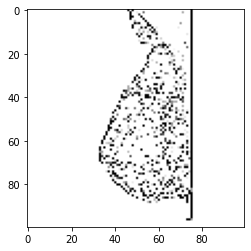

./all-mias/mdb244.pgm


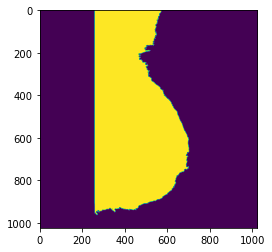

(100, 100)


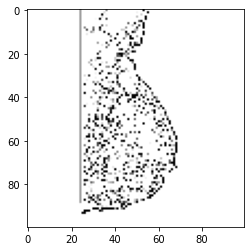

./all-mias/mdb245.pgm


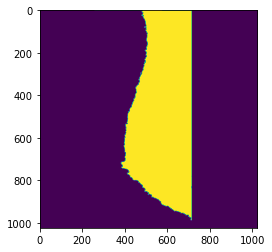

(100, 100)


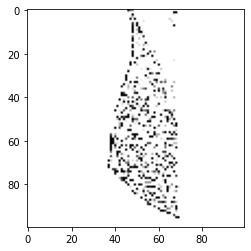

./all-mias/mdb246.pgm


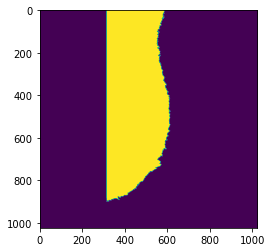

(100, 100)


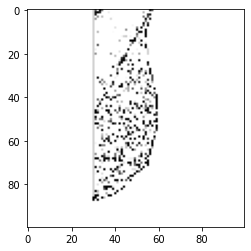

./all-mias/mdb247.pgm


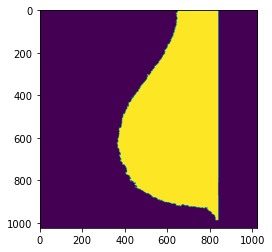

(100, 100)


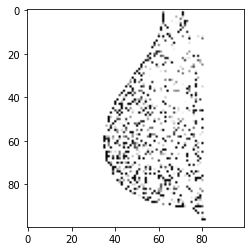

./all-mias/mdb248.pgm


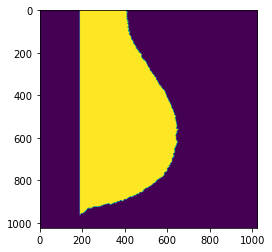

(100, 100)


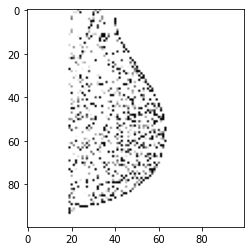

./all-mias/mdb249.pgm


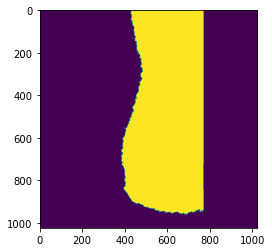

(100, 100)


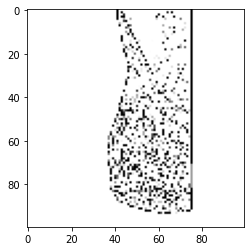

./all-mias/mdb250.pgm


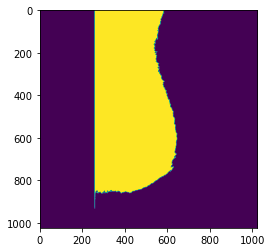

(100, 100)


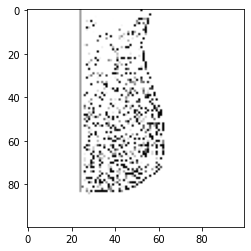

./all-mias/mdb251.pgm


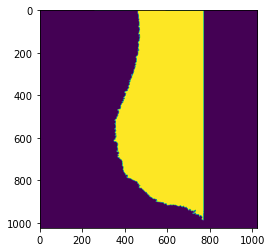

(100, 100)


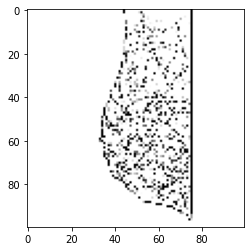

./all-mias/mdb252.pgm


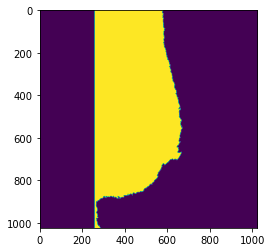

(100, 100)


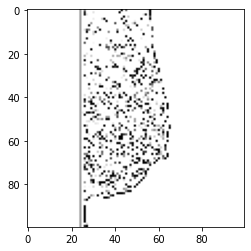

./all-mias/mdb253.pgm


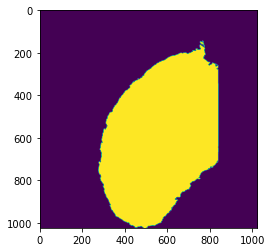

(100, 100)


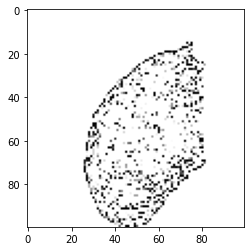

./all-mias/mdb254.pgm


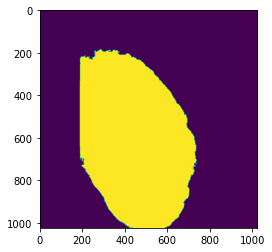

(100, 100)


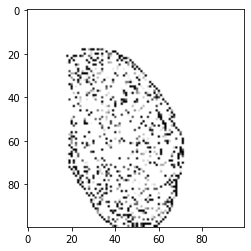

./all-mias/mdb255.pgm


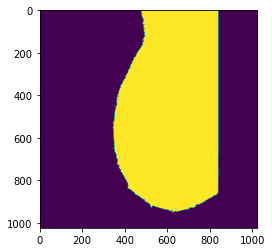

(100, 100)


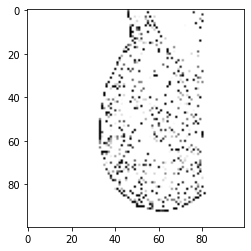

./all-mias/mdb256.pgm


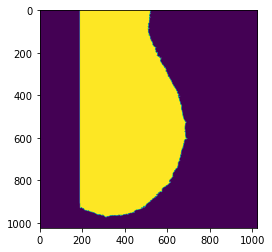

(100, 100)


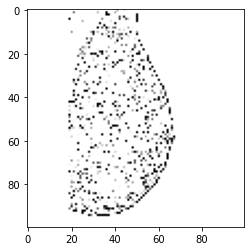

./all-mias/mdb257.pgm


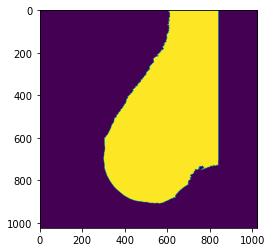

(100, 100)


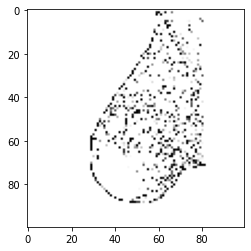

./all-mias/mdb258.pgm


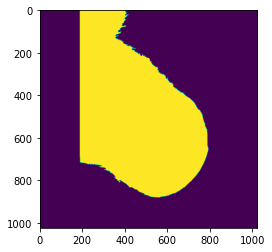

(100, 100)


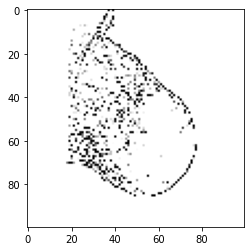

./all-mias/mdb259.pgm


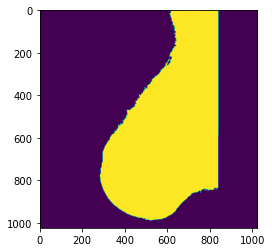

(100, 100)


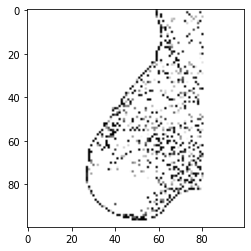

./all-mias/mdb260.pgm


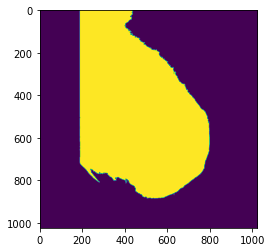

(100, 100)


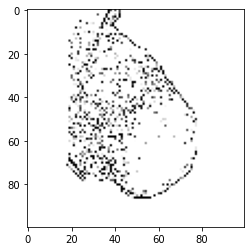

./all-mias/mdb261.pgm


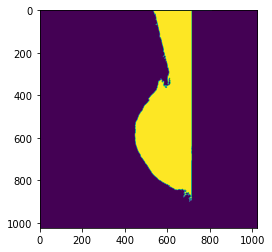

(100, 100)


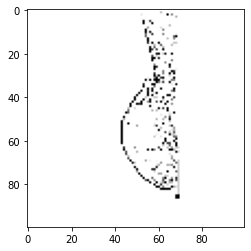

./all-mias/mdb262.pgm


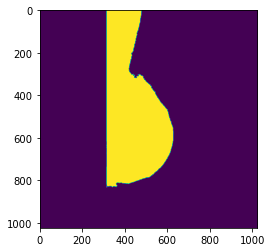

(100, 100)


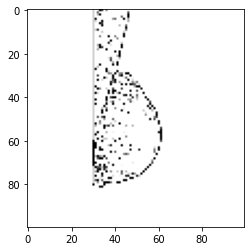

./all-mias/mdb263.pgm


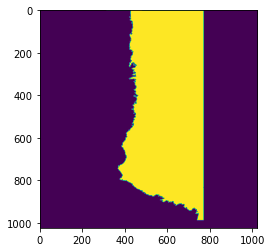

(100, 100)


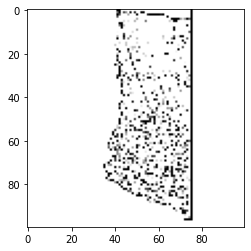

./all-mias/mdb264.pgm


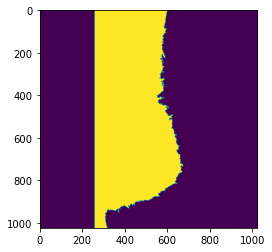

(100, 100)


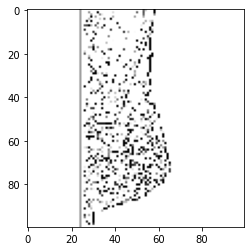

./all-mias/mdb265.pgm


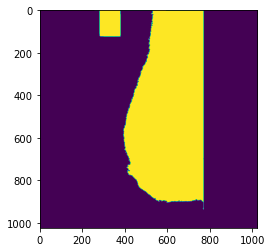

(100, 100)


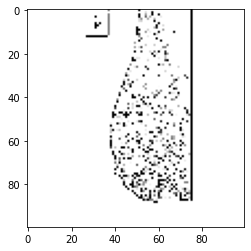

./all-mias/mdb266.pgm


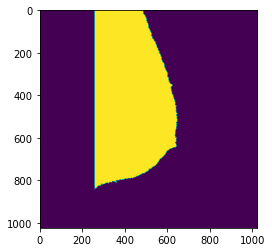

(100, 100)


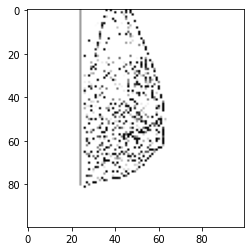

./all-mias/mdb267.pgm


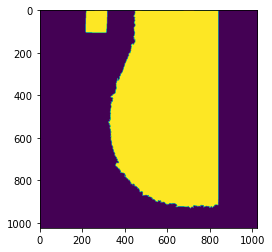

(100, 100)


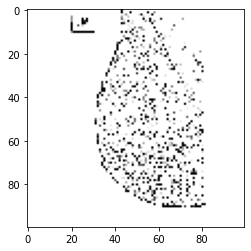

./all-mias/mdb268.pgm


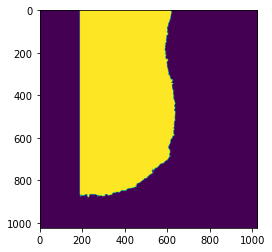

(100, 100)


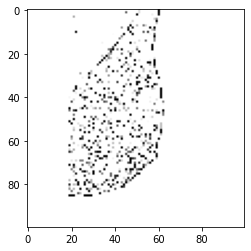

./all-mias/mdb269.pgm


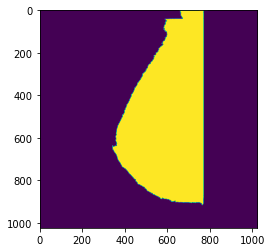

(100, 100)


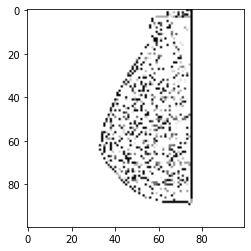

./all-mias/mdb270.pgm


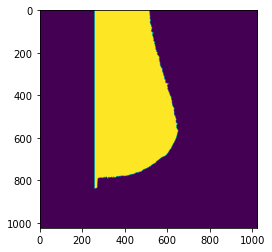

(100, 100)


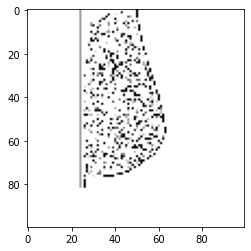

./all-mias/mdb271.pgm


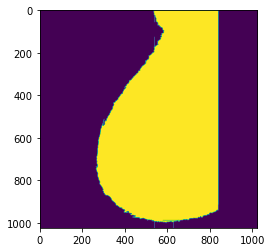

(100, 100)


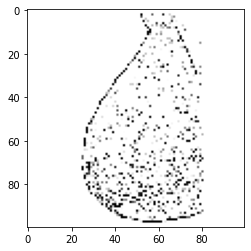

./all-mias/mdb272.pgm


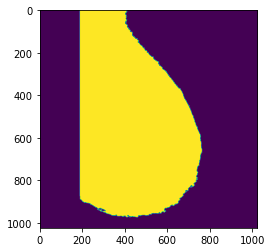

(100, 100)


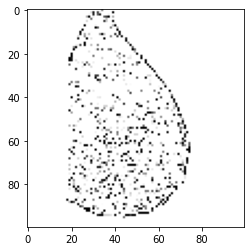

./all-mias/mdb273.pgm


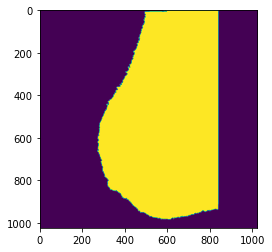

(100, 100)


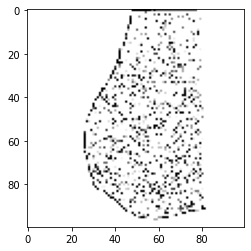

./all-mias/mdb274.pgm


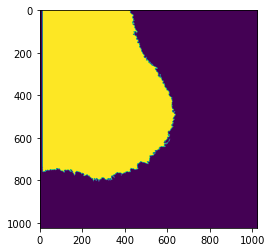

(100, 100)


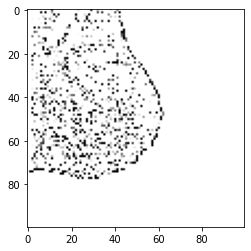

./all-mias/mdb275.pgm


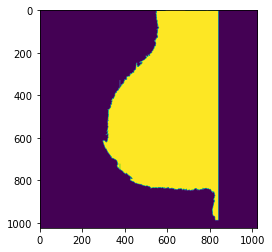

(100, 100)


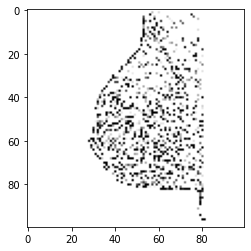

./all-mias/mdb276.pgm


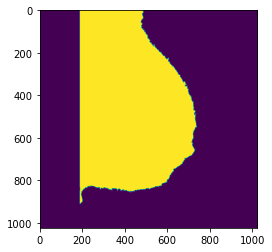

(100, 100)


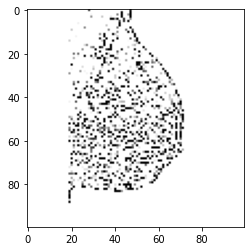

./all-mias/mdb277.pgm


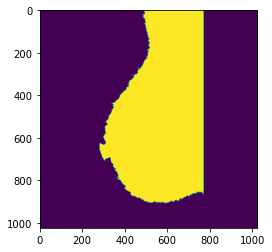

(100, 100)


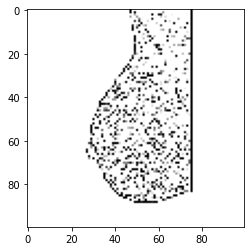

./all-mias/mdb278.pgm


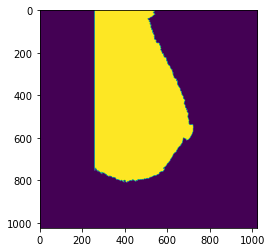

(100, 100)


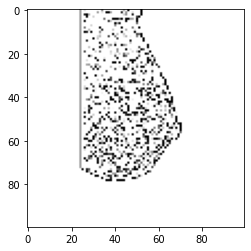

./all-mias/mdb279.pgm


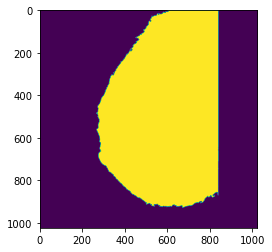

(100, 100)


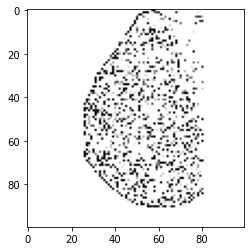

./all-mias/mdb280.pgm


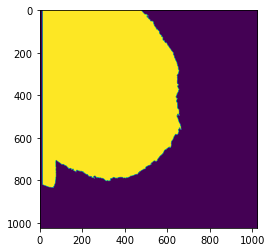

(100, 100)


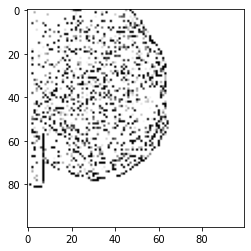

./all-mias/mdb281.pgm


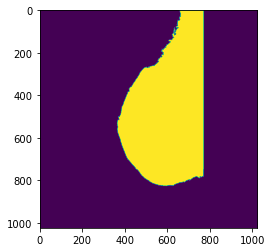

(100, 100)


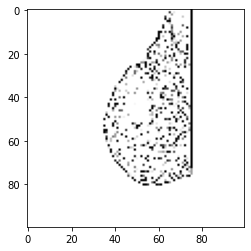

./all-mias/mdb282.pgm


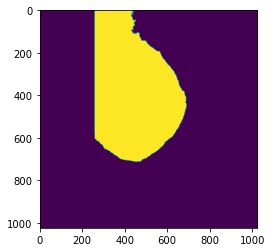

(100, 100)


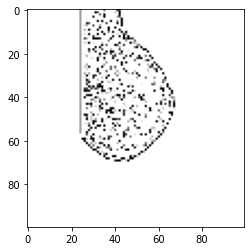

./all-mias/mdb283.pgm


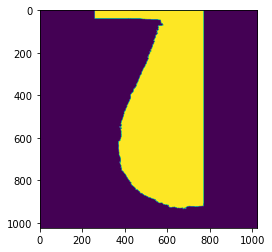

(100, 100)


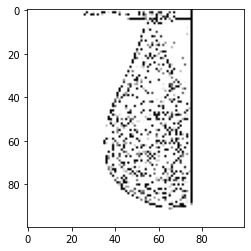

./all-mias/mdb284.pgm


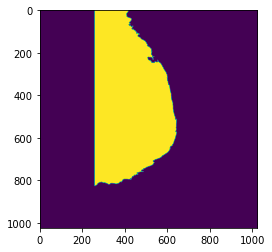

(100, 100)


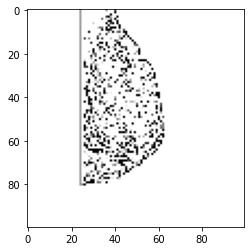

./all-mias/mdb285.pgm


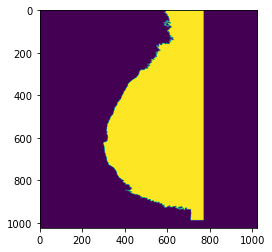

(100, 100)


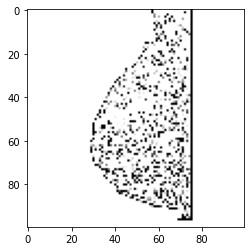

./all-mias/mdb286.pgm


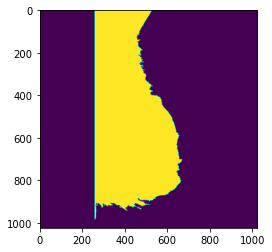

(100, 100)


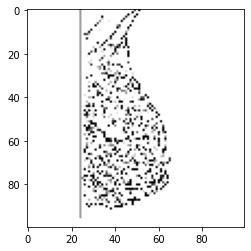

./all-mias/mdb287.pgm


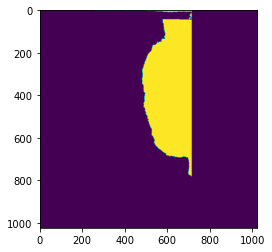

(100, 100)


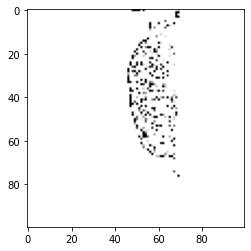

./all-mias/mdb288.pgm


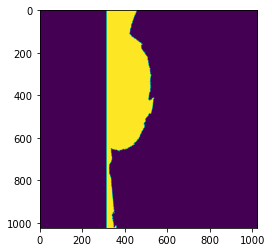

(100, 100)


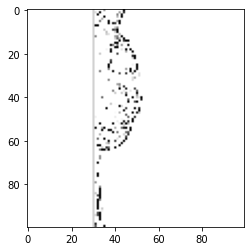

./all-mias/mdb289.pgm


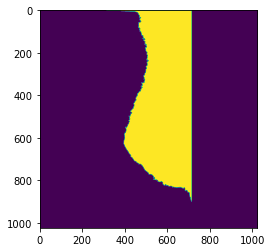

(100, 100)


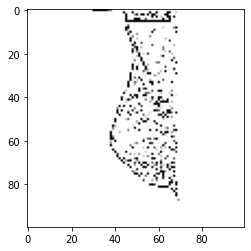

./all-mias/mdb290.pgm


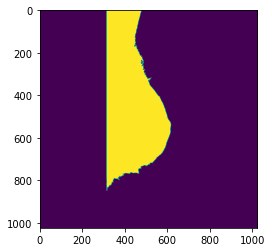

(100, 100)


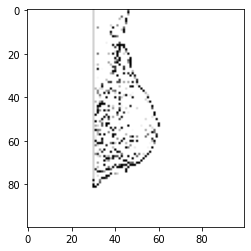

./all-mias/mdb291.pgm


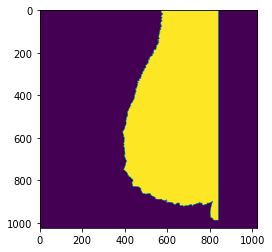

(100, 100)


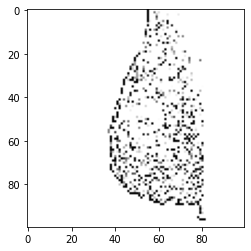

./all-mias/mdb292.pgm


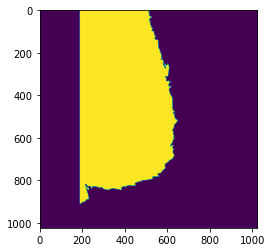

(100, 100)


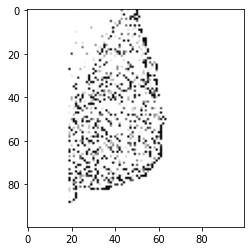

./all-mias/mdb293.pgm


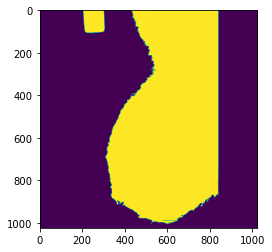

(100, 100)


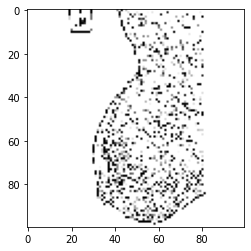

./all-mias/mdb294.pgm


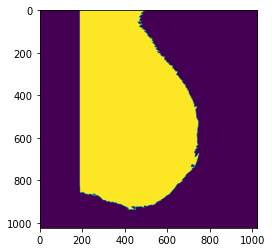

(100, 100)


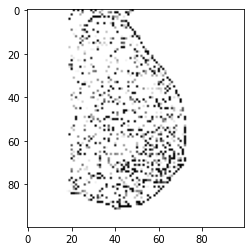

./all-mias/mdb295.pgm


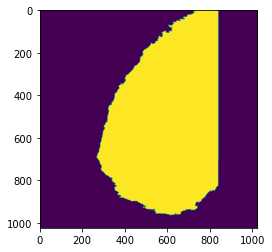

(100, 100)


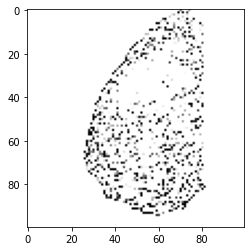

./all-mias/mdb296.pgm


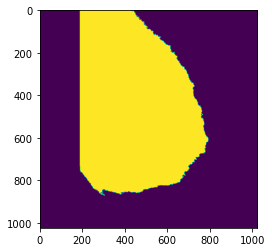

(100, 100)


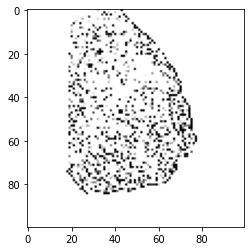

./all-mias/mdb297.pgm


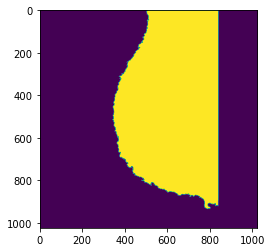

(100, 100)


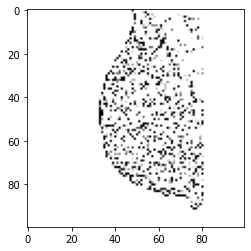

./all-mias/mdb298.pgm


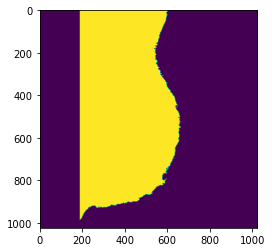

(100, 100)


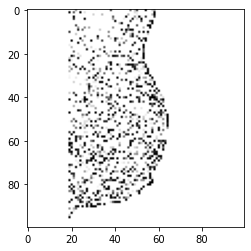

./all-mias/mdb299.pgm


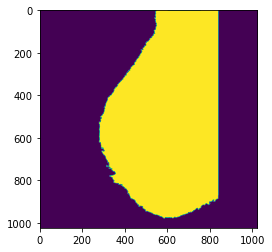

(100, 100)


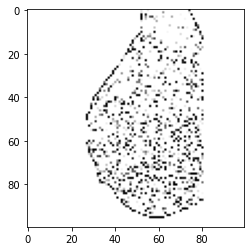

./all-mias/mdb300.pgm


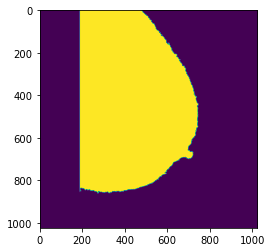

(100, 100)


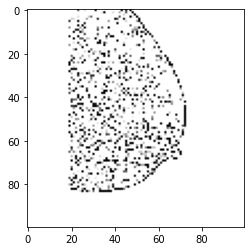

./all-mias/mdb301.pgm


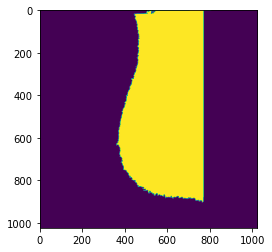

(100, 100)


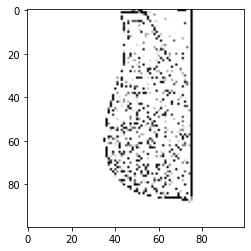

./all-mias/mdb302.pgm


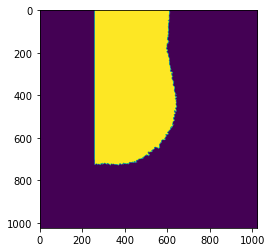

(100, 100)


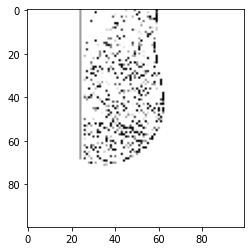

./all-mias/mdb303.pgm


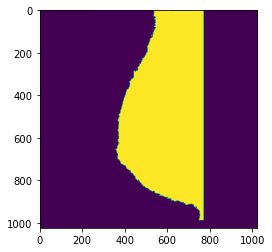

(100, 100)


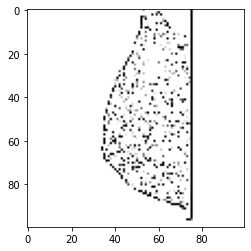

./all-mias/mdb304.pgm


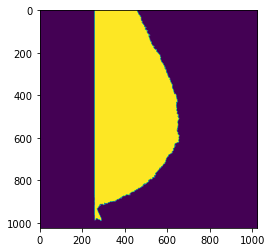

(100, 100)


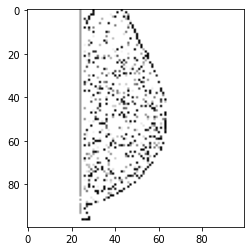

./all-mias/mdb305.pgm


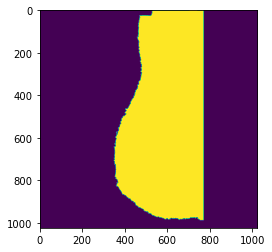

(100, 100)


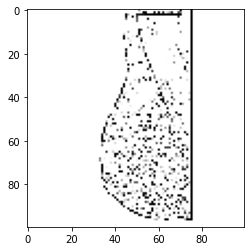

./all-mias/mdb306.pgm


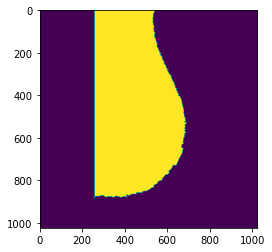

(100, 100)


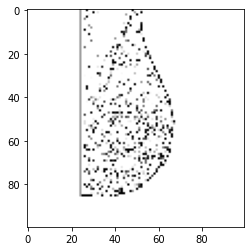

./all-mias/mdb307.pgm


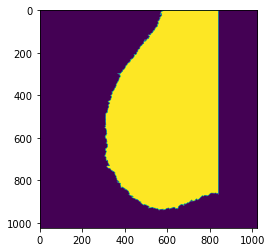

(100, 100)


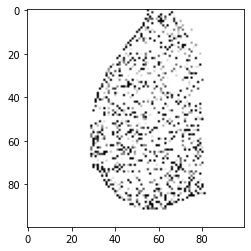

./all-mias/mdb308.pgm


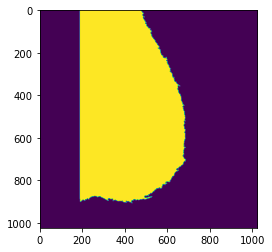

(100, 100)


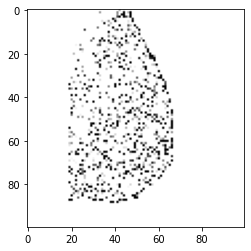

./all-mias/mdb309.pgm


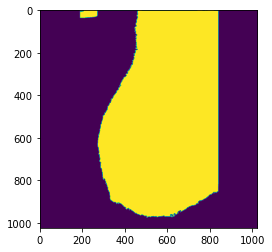

(100, 100)


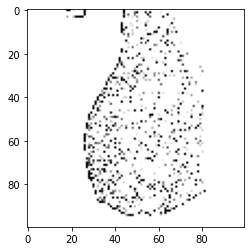

./all-mias/mdb310.pgm


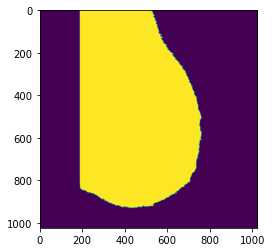

(100, 100)


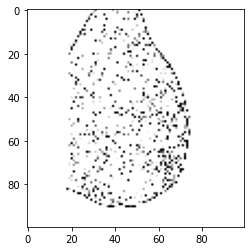

./all-mias/mdb311.pgm


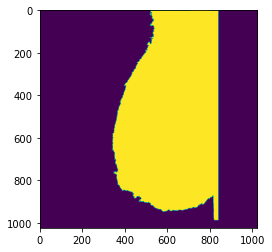

(100, 100)


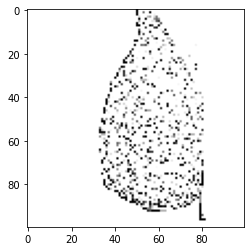

./all-mias/mdb312.pgm


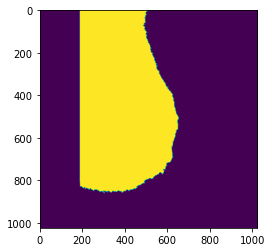

(100, 100)


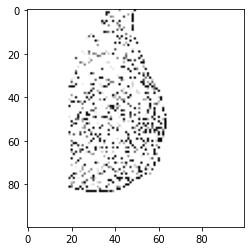

./all-mias/mdb313.pgm


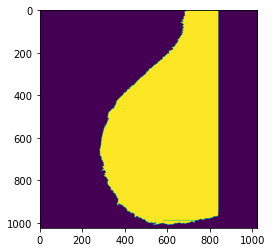

(100, 100)


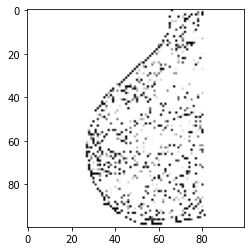

./all-mias/mdb314.pgm


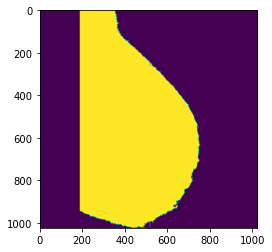

(100, 100)


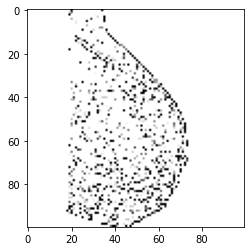

./all-mias/mdb315.pgm


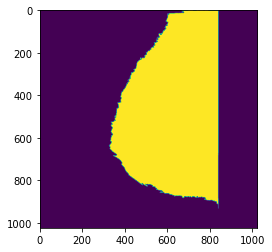

(100, 100)


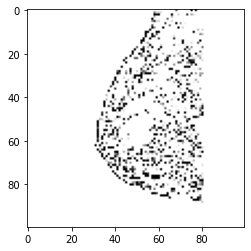

./all-mias/mdb316.pgm


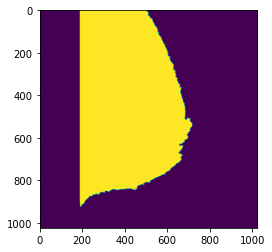

(100, 100)


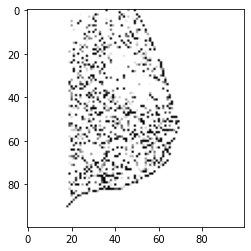

./all-mias/mdb317.pgm


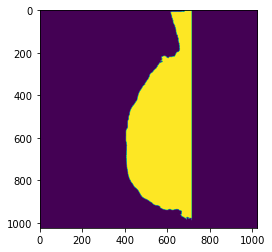

(100, 100)


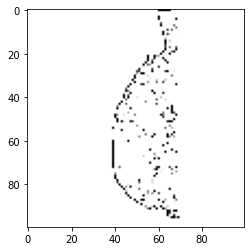

./all-mias/mdb318.pgm


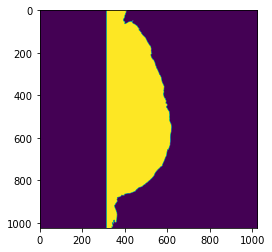

(100, 100)


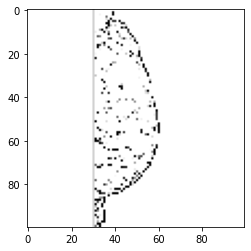

./all-mias/mdb319.pgm


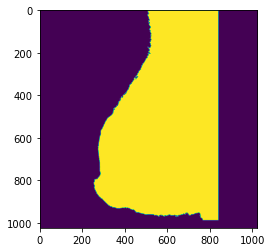

(100, 100)


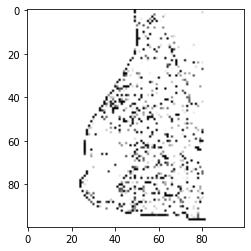

./all-mias/mdb320.pgm


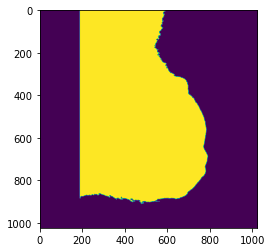

(100, 100)


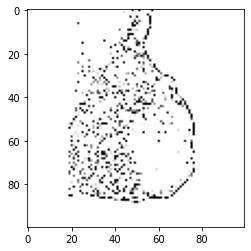

./all-mias/mdb321.pgm


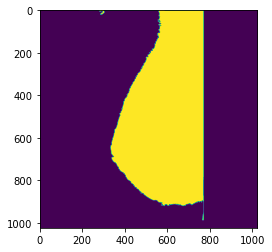

(100, 100)


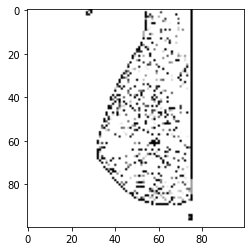

./all-mias/mdb322.pgm


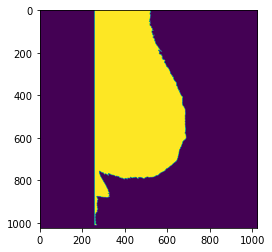

(100, 100)


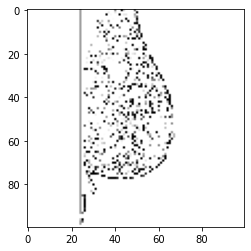

In [41]:
from numpy import asarray
directory = './all-mias'
count=0
import os
list1=[]
list2=[]
for filename in os.listdir(directory):
    filename = directory+'/'+ filename
    if filename.endswith('.pgm'):
        list1.append(0)
        print(filename)
        display_image(filename)
full_data_x = list2
list2=[]
# get_glcm(list2)
# with open("img_pixels.csv", 'w',newline='') as csvfile:  
#     # creating a csv writer object  
#     csvwriter = csv.writer(csvfile)  
        
#     # writing the fields  
#     csvwriter.writerows(list2)
#     print("done")
        

In [42]:
print(len(list1),len(full_data_x))
list2=full_data_x

322 322


In [43]:
# from numpy import asarray
# directory = './Abnormal'
# count=0
# import os
# for filename in os.listdir(directory):
#     filename = directory+'/'+ filename
#     if filename.endswith('.pgm'):
#         list1.append(1)
#         print(filename)
#         display_image(filename)
# # get_glcm(list2)
# # with open("img_pixels.csv", 'w',newline='') as csvfile:  
# #     # creating a csv writer object  
# #     csvwriter = csv.writer(csvfile)  
        
# #     # writing the fields  
# #     csvwriter.writerows(list2)
# #     print("done")
        

In [44]:
print(len(full_data_x),len(full_data_y))
z = list(zip(full_data_x, full_data_y))
# => [('Spears', 1), ('Adele', 2), ('NDubz', 3), ('Nicole', 4), ('Cristina', 5)]
random.shuffle(z)
list1, list2 = zip(*z)
print(list1)

322 322
(array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 25

dataset size :  322 322
One Image size:  (100, 100)
Train data : 225        Label:  225
Test data : 97          Label:  97


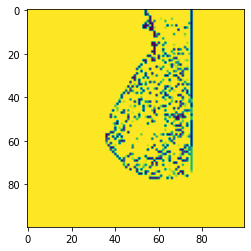

In [45]:
full_data_x=list1
full_data_y=list2
print("dataset size : ", len(full_data_x), len(full_data_y))
print("One Image size: ", full_data_x[2].shape)
train_imgs, test_imgs, train_y, test_y = train_test_split(full_data_x, full_data_y, test_size=0.3)
print("Train data :", len(train_imgs), "       Label: ", len(train_y))
# print("Validation data :", len(val_imgs), "   Label: ", len(val_y)) 
print("Test data :", len(test_imgs), "         Label: ", len(test_y))
plt.imshow(test_imgs[0])
# train_imgs=np.asarray(train_imgs).reshape(205,32,32,1)
# val_imgs=np.asarray(val_imgs).reshape(52,32,32,1)

In [46]:
import os
import cv2
import copy
import csv
import random
import pickle
import numpy as np
import pandas as pd
import itertools
from scipy.stats import randint
from itertools import cycle
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from sklearn import preprocessing
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from scipy.sparse import csr_matrix
from scipy import stats
# Import different classifiers
from sklearn import svm
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA
from skimage.feature import hog, local_binary_pattern, greycomatrix, greycoprops
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
def get_glcm(images, name='glcm', save=True):
    
    # GLCM feature for 1 image
    def get_image_glcm(img):
        image = img
        
        # GLCM Feature Extraction
        Grauwertmatrix = greycomatrix(image, [1, 2, 3], [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4],
                                                  symmetric=False, normed=True)
        
        contrast = greycoprops(Grauwertmatrix, 'contrast')
        dissimilarity = greycoprops(Grauwertmatrix, 'dissimilarity')
        homogeneity = greycoprops(Grauwertmatrix, 'homogeneity')
        energy = greycoprops(Grauwertmatrix, 'energy')
        correlation = greycoprops(Grauwertmatrix, 'correlation')
        ASM = greycoprops(Grauwertmatrix, 'ASM')
        
        # Merge all the features
        f = np.array([contrast,dissimilarity, homogeneity, energy, correlation, ASM])
        return f.flatten()
    
    
    # GLCM descriptor for all images
    features = []
    for img in images:
        dsc = get_image_glcm(img)
        features.append(dsc)
    
    result = np.array(features)
    
    if save:
        save_feature(result, name)
        
    return result

In [47]:
glcm_train = get_glcm(train_imgs, name='glcm_train', save=True)
glcm_val = get_glcm(test_imgs, name='glcm_val', save=True)

Feature saved with name cache/glcm_train.pkl
Feature saved with name cache/glcm_val.pkl


In [48]:
glcm_train = load_feature('glcm_train.pkl')
glcm_val = load_feature('glcm_val.pkl')

In [49]:
glcm_train.shape, glcm_val.shape


((225, 72), (97, 72))

In [50]:
def train_model(train_x, train_y, model_name='NB', validation=None):
    """
    Possible model names: ['NB', 'SVM', 'XGB', 'MLP', 'ADA', 'BAG', 'RF']
    default = 'NB'
    
    validation: (val_x, val_y) tupple for validation accuracy score.
    
    return: trained model
    """
    model = None
    if model_name == 'SVM':
        model = svm.SVC(gamma='scale', probability=True)
    elif model_name == 'MLP':
        model = MLPClassifier(hidden_layer_sizes=(100,100,100), max_iter=800, alpha=0.0001,
                     solver='sgd', verbose=10, tol=0.001)
    elif model_name == 'RF':
        model = RandomForestClassifier(n_estimators=200, max_depth=10)
    elif model_name == 'KNN':
        model = KNeighborsClassifier(n_neighbors=5, weights='distance', algorithm='auto', leaf_size=30, p=2, metric='minkowski', metric_params=None, n_jobs=None)
    else:
        model = GaussianNB()
    
    model.fit(train_x, train_y)
    
    if validation is not None:
        y_hat = model.predict(validation[0])
        acc = metrics.accuracy_score(validation[1], y_hat)
        print(f"Validation Accuracy in '{model_name}' = {acc}")
        cm = metrics.confusion_matrix(validation[1], y_hat)
        print(cm)
        recall = cm[0][0] / (cm[0][0] + cm[0][1])
        precision = cm[0][0] / (cm[0][0] + cm[1][0])
        f1 = 2*(precision*recall)/(precision+recall)
        print(f"Recall in '{model_name}' = {recall}")
        print(f"Precision in '{model_name}' = {precision}")
        print(f"F1 Score in '{model_name}' = {f1}")
               
    return model

In [51]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
# clf = DecisionTreeClassifier(max_depth=None, min_samples_split=2,   random_state=0)
# scores = cross_val_score(clf, glcm_train, train_y, cv=3)
# scores.mean()
# from sklearn.ensemble import RandomForestClassifier
# clf = RandomForestClassifier(n_estimators=200, max_depth=10,    min_samples_split=2, random_state=0)
# scores = cross_val_score(clf, glcm_val, full_data_y, cv=3)
# scores.mean()
# clf = ExtraTreesClassifier(n_estimators=10, max_depth=None,  min_samples_split=2, random_state=0)
# scores = cross_val_score(clf, glcm_train, train_y, cv=3)
# scores.mean()
# clf = AdaBoostClassifier(n_estimators=100)
# scores = cross_val_score(clf, glcm_train, train_y, cv=3)
# scores.mean()
clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,  max_depth=1, random_state=0).fit(glcm_train, train_y)
clf.score(glcm_val, test_y)

0.711340206185567

In [52]:
print(len(glcm_val),len(test_y))
print(test_y)
model1 = train_model(glcm_train, train_y, model_name='RF', validation=(glcm_val,test_y))

97 97
[0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0]
Validation Accuracy in 'RF' = 0.8247422680412371
[[80  0]
 [17  0]]
Recall in 'RF' = 1.0
Precision in 'RF' = 0.8247422680412371
F1 Score in 'RF' = 0.903954802259887


In [53]:
model5 = train_model(glcm_train, train_y, model_name='SVM', validation=(glcm_val, test_y))

Validation Accuracy in 'SVM' = 0.8247422680412371
[[80  0]
 [17  0]]
Recall in 'SVM' = 1.0
Precision in 'SVM' = 0.8247422680412371
F1 Score in 'SVM' = 0.903954802259887


In [54]:
model7 = train_model(np.array(glcm_train), train_y, model_name='KNN', validation=(glcm_val, test_y))

Validation Accuracy in 'KNN' = 0.8247422680412371
[[79  1]
 [16  1]]
Recall in 'KNN' = 0.9875
Precision in 'KNN' = 0.8315789473684211
F1 Score in 'KNN' = 0.9028571428571428


In [55]:
model7 = train_model(np.array(glcm_train), train_y, model_name='MLP', validation=(glcm_val, test_y))

Iteration 1, loss = inf
Iteration 2, loss = inf
Iteration 3, loss = 60.08592901
Iteration 4, loss = 121.06210766
Iteration 5, loss = 186.58529262
Iteration 6, loss = 250.21493371
Iteration 7, loss = 308.67696910
Iteration 8, loss = 360.47432456
Iteration 9, loss = 405.34097367
Iteration 10, loss = 443.54597838
Iteration 11, loss = 475.67735466
Iteration 12, loss = 502.43216182
Iteration 13, loss = 524.50748678
Iteration 14, loss = 542.68362231
Training loss did not improve more than tol=0.001000 for 10 consecutive epochs. Stopping.
Validation Accuracy in 'MLP' = 0.8247422680412371
[[80  0]
 [17  0]]
Recall in 'MLP' = 1.0
Precision in 'MLP' = 0.8247422680412371
F1 Score in 'MLP' = 0.903954802259887


In [56]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D

In [57]:
lb = preprocessing.LabelBinarizer()
y_train = lb.fit_transform(train_y)
y_test = lb.fit_transform(test_y)
y_train = to_categorical(train_y)
y_test = to_categorical(test_y)
train_imgs=np.asarray(train_imgs).reshape((-1,100,100,1))
test_imgs=np.asarray(test_imgs).reshape((-1,100,100,1))
print("X_train shape", train_imgs.shape)
print("Y_train shape", y_train.shape)

X_train shape (225, 100, 100, 1)
Y_train shape (225, 2)


In [58]:
model = Sequential()

model.add(Conv2D(filters=8,kernel_size=3,padding="same",activation="tanh",input_shape=(100,100,1)))
model.add(MaxPooling2D(pool_size=2))


model.add(Conv2D(filters=16,kernel_size=3,padding="same",activation="tanh"))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters=64,kernel_size=3,padding="same",activation="tanh"))
model.add(MaxPooling2D(pool_size=2))

model.add(Conv2D(filters=128,kernel_size=3,padding="same",activation="tanh"))
model.add(MaxPooling2D(pool_size=2))

model.add(Dropout(0.5))
model.add(Flatten())

model.add(Dense(100,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 100, 100, 8)       80        
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 50, 50, 8)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 50, 50, 16)        1168      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 25, 25, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 25, 25, 64)        9280      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 12, 12, 128)      

In [59]:
from keras.preprocessing.image import ImageDataGenerator


gen = ImageDataGenerator(rotation_range=18, width_shift_range=0.08, shear_range=0.3,
                         height_shift_range=0.08, zoom_range=0.08)

test_gen = ImageDataGenerator()
train_generator = gen.flow(train_imgs, train_y, batch_size=5)
test_generator = test_gen.flow(test_imgs, test_y, batch_size=1)

In [60]:
from keras.optimizers import SGD
opt = SGD(lr=0.01, momentum=0.9)
model.compile(loss='mse',optimizer='adam',metrics=['acc'])
hist=model.fit(train_generator, steps_per_epoch=225//5, epochs=50, 
                    validation_data=test_generator)


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 45 steps, validate for 97 steps
Epoch 1/50
45/45 [==============================] - 7s 155ms/step - loss: 0.2792 - acc: 0.4978 - val_loss: 0.2500 - val_acc: 0.9278
Epoch 2/50
45/45 [==============================] - 6s 124ms/step - loss: 0.2500 - acc: 0.5778 - val_loss: 0.2500 - val_acc: 0.5361
Epoch 3/50
45/45 [==============================] - 6s 132ms/step - loss: 0.2500 - acc: 0.7200 - val_loss: 0.2500 - val_acc: 0.9794
Epoch 4/50
45/45 [==============================] - 6s 130ms/step - loss: 0.2500 - acc: 0.7867 - val_loss: 0.2500 - val_acc: 0.8866
Epoch 5/50
45/45 [==============================] - 6s 126ms/step - loss: 0.2500 - acc: 0.7822 - val_loss: 0.2500 - val_acc: 1.0000
Epoch 6/50
45/45 [==============================] - 6s 126ms/step - loss: 0.2500 - acc: 0.7778 - val_loss: 0.2500 - val_acc: 0.9794
Epoch 7/50
45/45 [==============================] - 6s 126ms/step - loss: 0.2500 - acc: 0.7778 - val_loss: 0.2500 - 

In [61]:
y_pred = model.predict(test_imgs, batch_size=64, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)
from sklearn.metrics import classification_report
print(classification_report(test_y, y_pred_bool))

97/97 [==============================] - 1s 5ms/sample
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        80
           1       0.18      1.00      0.30        17

    accuracy                           0.18        97
   macro avg       0.09      0.50      0.15        97
weighted avg       0.03      0.18      0.05        97



c:\users\toorr\appdata\local\programs\python\python37\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [63]:
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix
X_test=test_imgs
y_test=test_y
y_pred1 = model.predict(X_test)
y_pred = np.argmax(y_pred1, axis=1)

# Print f1, precision, and recall scores
print(precision_score(y_test, y_pred , average=None))
print(recall_score(y_test, y_pred , average=None))
print(f1_score(y_test, y_pred , average=None))


[0.         0.17525773]
[0. 1.]
[0.         0.29824561]
